# Environment Setup

In [0]:
# Run then restart runtime
!apt-get install python3-rtree
!pip install pystac
!pip install geopandas
!pip install rasterio
!pip install descartes
!pip install solaris==0.2.0
!pip install rio-tiler

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
  python3-pkg-resources
Suggested packages:
  python3-setuptools
The following NEW packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
  python3-pkg-resources python3-rtree
0 upgraded, 5 newly installed, 0 to remove and 25 not upgraded.
Need to get 671 kB of archives.
After this operation, 3,948 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex4v5 amd64 1.8.5-5 [219 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex-c4v5 amd64 1.8.5-5 [51.7 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-pkg

     |████████████████████████████████| 931kB 2.9MB/s 
     |████████████████████████████████| 14.7MB 64.5MB/s 
     |████████████████████████████████| 10.4MB 37.7MB/s 
     |████████████████████████████████| 18.0MB 243kB/s 
     |████████████████████████████████| 10.2MB 2.7MB/s 
     |████████████████████████████████| 61kB 8.8MB/s 
     |████████████████████████████████| 61kB 8.7MB/s 
     |████████████████████████████████| 26.6MB 1.2MB/s 
     |████████████████████████████████| 3.2MB 42.9MB/s 
     |████████████████████████████████| 92.5MB 45kB/s 
     |████████████████████████████████| 276kB 56.5MB/s 
     |████████████████████████████████| 634kB 55.6MB/s 
     |████████████████████████████████| 3.2MB 35.1MB/s 
     |████████████████████████████████| 368kB 61.1MB/s 
  Created wheel for rio-cogeo: filename=rio_cogeo-1.1.10-cp36-none-any.whl size=17290 sha256=2484702755f2ca072088a17aa579033d6df1c5c995207d434e2805f5aecc34ec
  Stored in directory: /root/.cache/pip/wheels/01/c8/ec/315e00

     |████████████████████████████████| 122kB 2.8MB/s 
  Created wheel for rio-tiler: filename=rio_tiler-1.4.0-cp36-none-any.whl size=173020 sha256=12078a378479189b2f3f1de317002717ec64e3e1a7adba540853e4abdf4d4682
  Stored in directory: /root/.cache/pip/wheels/c4/f1/d3/60b689580c9701d5b5332d8fe3675a3c8a8c8342e192e3a8d5
  Created wheel for rio-toa: filename=rio_toa-0.3.0-cp36-none-any.whl size=12428 sha256=4d774c347cd9c343eba8f8126450f7bf6b7f49f7c8d93ef0bfc4d042fb13741a
  Stored in directory: /root/.cache/pip/wheels/12/25/52/036fe06fa14768bf5e4eef4abd4beccb3924b695199f1721a2
Successfully built rio-tiler rio-toa


In [0]:
# Imports
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from pprint import pprint
import solaris as sol
from pathlib import Path
import rasterio
from rasterio.windows import Window
import geopandas as gpd
from pystac import (Catalog, CatalogType, Item, Asset, LabelItem, Collection)
from rasterio.transform import from_bounds
from shapely.geometry import Polygon
from shapely.ops import cascaded_union
from rio_tiler import main as rt_main
import skimage
from tqdm import tqdm
import os
os.environ["CURL_CA_BUNDLE"] = "/etc/ssl/certs/ca-certificates.crt" #Q! chưa rõ để làm gì, dường như liên quan đến đặt môi trường để chạy được requests khi gọi lib requests https://stackoverflow.com/questions/48391750/disable-python-requests-ssl-validation-for-an-imported-module

# We have to add this wrkaround for stackio:
# (https://pystac.readthedocs.io/en/latest/concepts.html#using-stac-io)
from urllib.parse import urlparse
import requests
from pystac import STAC_IO
def my_read_method(uri):
    parsed = urlparse(uri)
    if parsed.scheme.startswith('http'):
        return requests.get(uri).text
    else:
        return STAC_IO.default_read_text_method(uri)
STAC_IO.read_text_method = my_read_method

In [0]:
# Folder Setup
data_dir = Path('data')
data_dir.mkdir(exist_ok=True)

img_path = data_dir/'images-256'
mask_path = data_dir/'masks-256'
img_path.mkdir(exist_ok=True)
mask_path.mkdir(exist_ok=True)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Loading the data

In [0]:
# load our training and test catalogs
train1_cat = Catalog.from_file('https://drivendata-competition-building-segmentation.s3-us-west-1.amazonaws.com/train_tier_1/catalog.json')
train2_cat = Catalog.from_file('https://drivendata-competition-building-segmentation.s3-us-west-1.amazonaws.com/train_tier_2/catalog.json')
test_cat = Catalog.from_file('https://drivendata-competition-building-segmentation.s3-us-west-1.amazonaws.com/test/catalog.json')
cols = {cols.id:cols for cols in train1_cat.get_children()}

In [0]:
# Get a list of the possible areas ('scenes) and ids
areas = []
for c in cols:
  itms = [x for x in cols[c].get_all_items()]
  for i, id in enumerate(itms):
    if i % 2 == 0 and i+1 < len(itms):
      areas.append((c, itms[i].id, itms[i+1].id))
print(areas)

[('acc', '665946', '665946-labels'), ('acc', 'a42435', 'a42435-labels'), ('acc', 'ca041a', 'ca041a-labels'), ('acc', 'd41d81', 'd41d81-labels'), ('mon', '401175', '401175-labels'), ('mon', '493701', '493701-labels'), ('mon', '207cc7', '207cc7-labels'), ('mon', 'f15272', 'f15272-labels'), ('ptn', 'abe1a3', 'abe1a3-labels'), ('ptn', 'f49f31', 'f49f31-labels'), ('kam', '4e7c7f', '4e7c7f-labels'), ('dar', 'a017f9', 'a017f9-labels'), ('dar', 'b15fce', 'b15fce-labels'), ('dar', '353093', '353093-labels'), ('dar', 'f883a0', 'f883a0-labels'), ('dar', '42f235', '42f235-labels'), ('dar', '0a4c40', '0a4c40-labels'), ('znz', '33cae6', '33cae6-labels'), ('znz', '3b20d4', '3b20d4-labels'), ('znz', '076995', '076995-labels'), ('znz', '75cdfa', '75cdfa-labels'), ('znz', '9b8638', '9b8638-labels'), ('znz', '06f252', '06f252-labels'), ('znz', 'c7415c', 'c7415c-labels'), ('znz', 'aee7fd', 'aee7fd-labels'), ('znz', '3f8360', '3f8360-labels'), ('znz', '425403', '425403-labels'), ('znz', 'bd5c14', 'bd5c14-l

# Getting the data into a useful form

Ideally, we'd like images in nice squares with the labels as masks - then we can follow normal image segmentation workflows. Currently, the data is all in a stac. This code takes an area (scene), splits it into tiles at a given zoom level (19 works well to see several buildings) and saves each tile + a mask representing the building fotprints. 

Set greyscale=False to get a 3-channel mask with footprints, outlines and contact areas. 

Apologies for the lack of documentation, but for more info and the source of a lot of this code see 
- https://gist.github.com/daveluo/57ada6ba61ff7c947aad8d6aaeeeb9e4
- https://medium.com/@anthropoco/how-to-segment-buildings-on-drone-imagery-with-fast-ai-cloud-native-geodata-tools-ae249612c321

I've also made some of the data available already here: https://www.kaggle.com/johnowhitaker/opencities-masked-256

I'll be working on making a more complete tutorial from start to finish, but I hope this is useful in the meantime.

In [0]:
def save_tile_img(tif_url, xyz, tile_size, save_path='', prefix='', display=False):
  x,y,z = xyz
  tile, mask = rt_main.tile(tif_url, x,y,z, tilesize=tile_size)
  if display: 
    plt.imshow(np.moveaxis(tile,0,2))
    plt.show()
  skimage.io.imsave(f'{save_path}/{prefix}{z}_{x}_{y}.png',np.moveaxis(tile,0,2), check_contrast=False) 

def save_tile_mask(labels_poly, tile_poly, xyz, tile_size, save_path='', prefix='', display=False, greyscale=True):
  x,y,z = xyz
  tfm = from_bounds(*tile_poly.bounds, tile_size, tile_size) 
  
  cropped_polys = [poly for poly in labels_poly if poly.intersects(tile_poly)]
  cropped_polys_gdf = gpd.GeoDataFrame(geometry=cropped_polys, crs='epsg:4326')
  
  fbc_mask = sol.vector.mask.df_to_px_mask(df=cropped_polys_gdf,
                                         channels=['footprint', 'boundary', 'contact'],
                                         affine_obj=tfm, shape=(tile_size,tile_size),
                                         boundary_width=5, boundary_type='inner', contact_spacing=5, meters=True)
  
  if display: plt.imshow(fbc_mask); plt.show()
  
  if greyscale:
    skimage.io.imsave(f'{save_path}/{prefix}{z}_{x}_{y}_mask.png',fbc_mask[:,:,0], check_contrast=False) 
  else:
    skimage.io.imsave(f'{save_path}/{prefix}{z}_{x}_{y}_mask.png',fbc_mask, check_contrast=False) 

def save_area_id_images(area = 'acc', img_id = 'ca041a', label_id='ca041a-labels', zoom_level = 19, tile_size = 256):

  # The item
  one_item = cols[area].get_item(id=img_id)

  # Load labels shapefile
  lab = cols[area].get_item(id=label_id)
  gdf = gpd.read_file(lab.make_asset_hrefs_absolute().assets['labels'].href)
  # get the geometries from the geodataframe
  all_polys = gdf.geometry

  # Get outlines as polygons
  polygon_geom = Polygon(one_item.to_dict()['geometry']['coordinates'][0])
  polygon = gpd.GeoDataFrame(index=[0], crs=gdf.crs, geometry=[polygon_geom])   

  # Tile at zoom_level
  polygon['geometry'].to_file(img_id+'.geojson', driver='GeoJSON')
  !cat {img_id}.geojson | supermercado burn {zoom_level} | mercantile shapes | fio collect > {img_id}{zoom_level}tiles.geojson

  # Load tiles
  tiles = gpd.read_file(f'{img_id}{zoom_level}tiles.geojson')

  # Add a convenience column
  tiles['xyz'] = tiles.id.apply(lambda x: x.lstrip('(,)').rstrip('(,)').split(','))
  tiles['xyz'] = [[int(q) for q in p] for p in tiles['xyz']]

  # IMG URL
  tif_url = one_item.assets['image'].href

  # Sometimes it's just ./id.tif - add full path (should maybe use make_asset_hrefs_absolute instead!!)
  if tif_url.startswith("./"):
    tif_url = '/'.join(one_item.to_dict()['links'][1]['href'].split("/")[:-1])+tif_url[1:]

  print("TIF URL:", tif_url)

  print("Number of tiles:", len(tiles))

  # Loop through tiles, downloading and saving
  for idx in range(len(tiles)):
    tile, mask = rt_main.tile(tif_url, *tiles.iloc[idx]['xyz'], tilesize=tile_size)

    tile_poly = tiles.iloc[idx]['geometry']

    # get affine transformation matrix for this tile using rasterio.transform.from_bounds: https://rasterio.readthedocs.io/en/stable/api/rasterio.transform.html#rasterio.transform.from_bounds
    tfm = from_bounds(*tile_poly.bounds, tile_size, tile_size) 

    # crop geometries to what overlaps our tile polygon bounds
    cropped_polys = [poly for poly in all_polys if poly.intersects(tile_poly)]
    cropped_polys_gdf = gpd.GeoDataFrame(geometry=cropped_polys, crs='epsg:4326')

    # burn a footprint/boundary/contact 3-channel mask with solaris: https://solaris.readthedocs.io/en/latest/tutorials/notebooks/api_masks_tutorial.html
    fbc_mask = sol.vector.mask.df_to_px_mask(df=cropped_polys_gdf,
                                            channels=['footprint', 'boundary', 'contact'],
                                            affine_obj=tfm, shape=(tile_size,tile_size),
                                            boundary_width=5, boundary_type='inner', contact_spacing=5, meters=True)

    save_tile_img(tif_url, tiles.iloc[idx]['xyz'], tile_size, save_path=img_path, prefix=f'{area}_{img_id}_{idx}_', display=False)
    save_tile_mask(all_polys, tile_poly, tiles.iloc[idx]['xyz'], tile_size, save_path=mask_path,prefix=f'{area}_{img_id}_{idx}_', display=False)
    print("Saved", f'{area}_{img_id}_{idx}_')

In [0]:
train1_cat.describe()

* <Catalog id=train_tier_1>
    * <Collection id=acc>
      * <Item id=665946>
      * <LabelItem id=665946-labels>
      * <Item id=a42435>
      * <LabelItem id=a42435-labels>
      * <Item id=ca041a>
      * <LabelItem id=ca041a-labels>
      * <Item id=d41d81>
      * <LabelItem id=d41d81-labels>
    * <Collection id=mon>
      * <Item id=401175>
      * <LabelItem id=401175-labels>
      * <Item id=493701>
      * <LabelItem id=493701-labels>
      * <Item id=207cc7>
      * <LabelItem id=207cc7-labels>
      * <Item id=f15272>
      * <LabelItem id=f15272-labels>
    * <Collection id=ptn>
      * <Item id=abe1a3>
      * <LabelItem id=abe1a3-labels>
      * <Item id=f49f31>
      * <LabelItem id=f49f31-labels>
    * <Collection id=kam>
      * <Item id=4e7c7f>
      * <LabelItem id=4e7c7f-labels>
    * <Collection id=dar>
      * <Item id=a017f9>
      * <LabelItem id=a017f9-labels>
      * <Item id=b15fce>
      * <LabelItem id=b15fce-labels>
      * <Item id=353093>
      * <La

In [0]:
save_area_id_images(area = 'znz', img_id = '3b20d4', label_id='3b20d4-labels', zoom_level = 19, tile_size = 256)

TIF URL: https://drivendata-competition-building-segmentation.s3-us-west-1.amazonaws.com/train_tier_1/znz/3b20d4/3b20d4.tif
Number of tiles: 1709


TileOutsideBounds: ignored

**Load saved data**

In [0]:
# TO save for later w drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
# Compress
!tar -czf my_data.tar.gz data

In [0]:
# copy training data compressed tarball to drive
!cp my_data.tar.gz /content/drive/My\ Drive/Colab_Notebooks/competitions/data 

# Check that it worked!



```
`# This is formatted as code`
```

# New Section

In [0]:
# Pick a random tile
import glob, random
from IPython.display import Image as SHOW_IM
images = glob.glob('data/images-256/*.png')
im = random.choice(images)
SHOW_IM(im)

IndexError: ignored

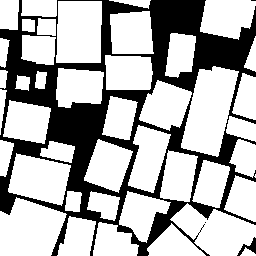

In [0]:
SHOW_IM(im.replace('images', 'masks').replace('.png', '_mask.png')) # The corresponding mask

In [0]:
# You could fetch all the data with:
# for a in areas:
#   save_area_id_images(area = a[0], img_id = a[1], label_id=a[2], zoom_level = 19, tile_size = 256)

In [0]:
# from PIL import Image as Open_IM
# type(Open_IM.open(im))
# im_mask = im.replace('images', 'masks').replace('.png', '_mask.png')
# Open_IM.open(im_mask)

**Test on building model**

In [0]:
#Reload saved data and libs
import cv2
from google.colab.patches import cv2_imshow #Cannot use cv2.imshow
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Dropout
import numpy as np

from google.colab import drive
drive.mount('/content/drive')
import glob, random
from sklearn.metrics import jaccard_score

Mounted at /content/drive


In [0]:
#Define model
model = Sequential([
    Dense( 30000, input_shape = (65536,), activation='relu' ),
    Dropout(0.5),
    # Dense( 10000 , activation='relu' ),
    Dense( 3000 , activation='relu' ),
    Dropout(0.25), 
    # Dense( 1000 , activation='relu' ),
    Dense( 30000 , activation='relu' ),
    Dropout(0.5),
    # Dense( 10000 , activation='relu' ),
    Dense( 65536,  activation='sigmoid' )
])

#compile model using mse as a measure of model performance
model.compile(optimizer='adam', loss='mean_squared_error', metrics = ['mae', 'mse'])
model.summary()





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 30000)             1966110000
_________________________________________________________________
dropout_1 (Dropout)          (None, 30000)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 3000)              90003000  
_________________________________________________________________
dropout_2 (Dropout)          (None, 3000)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 30000)             90030000  
_________________________________________________________________
dropout_3 (Dropout)          (None, 30000)             0         


In [0]:
images

[]

In [0]:
#Load data and train model 
def load_to_grayim(im_path):
  original_im = cv2.imread(im_path)
  return cv2.cvtColor(original_im, cv2.COLOR_BGR2GRAY)

def grayim_to_binary(im_array):
  return im_array/255

images = glob.glob('data/images-256/*.png')
cutoff_point = int(len(images)*0.75)
train_set = images[:cutoff_point]
test_set = images[cutoff_point:]

X, Y = [], []
for im in train_set:
  im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
  
  im_data = load_to_grayim(im).reshape(65536, 1)
  im_mask_data = load_to_grayim(im_mask).reshape(65536, 1)
  X.append(im_data)
  Y.append( grayim_to_binary( im_mask_data) )

  # #Fit model
  # model.fit( im_data, im_mask_data )
  
X = np.array(X).reshape(64,65536)
Y = np.array(Y).reshape(64,65536)

ValueError: ignored

In [0]:
history = model.fit(X, Y, batch_size= 1, epochs= 20)

Epoch 1/20
64/64 [==============================] - 56s 867ms/step - loss: 0.3932 - mean_absolute_error: 0.3932 - mean_squared_error: 0.3932
Epoch 2/20
64/64 [==============================] - 56s 869ms/step - loss: 0.3925 - mean_absolute_error: 0.3925 - mean_squared_error: 0.3925
Epoch 3/20
64/64 [==============================] - 56s 874ms/step - loss: 0.3921 - mean_absolute_error: 0.3921 - mean_squared_error: 0.3921
Epoch 4/20
64/64 [==============================] - 56s 873ms/step - loss: 0.3911 - mean_absolute_error: 0.3911 - mean_squared_error: 0.3911
Epoch 5/20
64/64 [==============================] - 56s 868ms/step - loss: 0.3909 - mean_absolute_error: 0.3909 - mean_squared_error: 0.3909
Epoch 6/20
64/64 [==============================] - 56s 868ms/step - loss: 0.3908 - mean_absolute_error: 0.3908 - mean_squared_error: 0.3908
Epoch 7/20
64/64 [==============================] - 56s 876ms/step - loss: 0.3908 - mean_absolute_error: 0.3908 - mean_squared_error: 0.3908
Epoch 8/20
64

---------- data/images-256/mon_f15272_52_19_246419_252910.png ---------- 
 Real IM


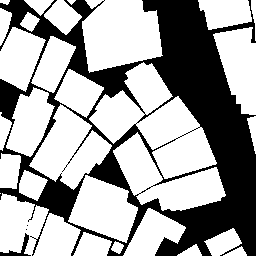

Predict IM


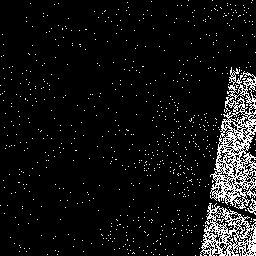

---------- data/images-256/mon_f15272_83_19_246421_252913.png ---------- 
 Real IM


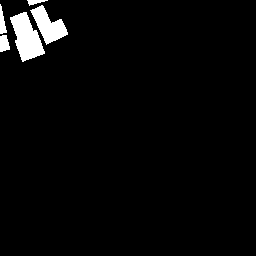

Predict IM


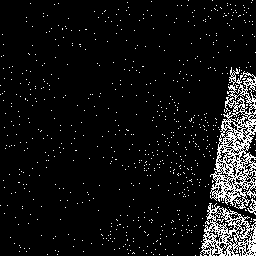

---------- data/images-256/mon_f15272_45_19_246424_252909.png ---------- 
 Real IM


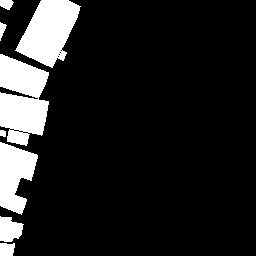

Predict IM


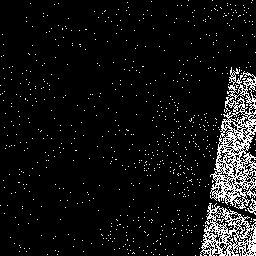

---------- data/images-256/mon_f15272_69_19_246415_252912.png ---------- 
 Real IM


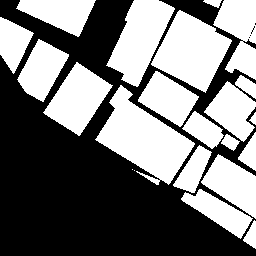

Predict IM


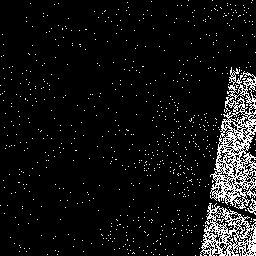

---------- data/images-256/mon_f15272_33_19_246424_252908.png ---------- 
 Real IM


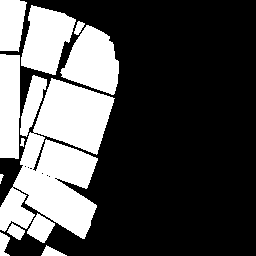

Predict IM


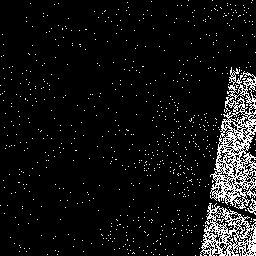

---------- data/images-256/mon_f15272_30_19_246421_252908.png ---------- 
 Real IM


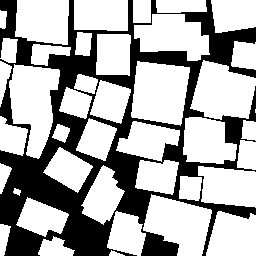

Predict IM


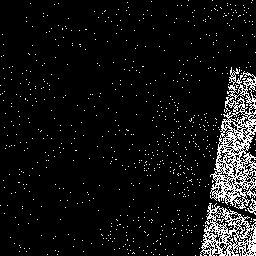

---------- data/images-256/mon_f15272_44_19_246423_252909.png ---------- 
 Real IM


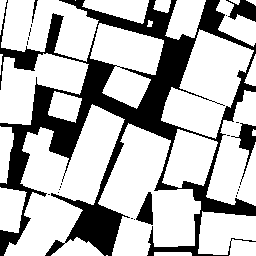

Predict IM


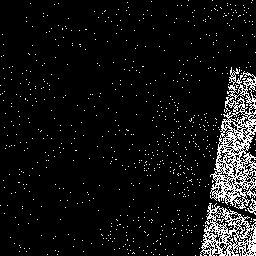

---------- data/images-256/mon_f15272_46_19_246413_252910.png ---------- 
 Real IM


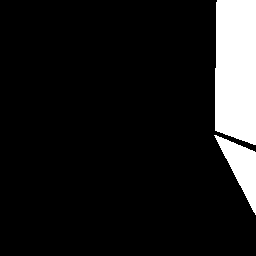

Predict IM


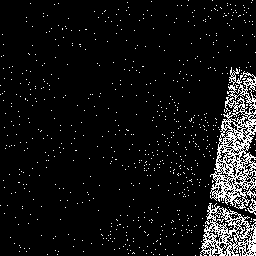

---------- data/images-256/mon_f15272_3_19_246415_252905.png ---------- 
 Real IM


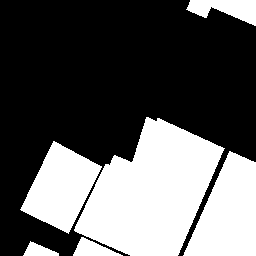

Predict IM


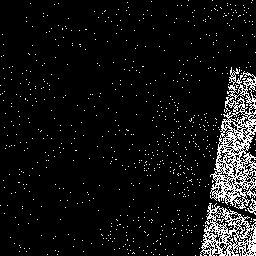

---------- data/images-256/mon_f15272_71_19_246417_252912.png ---------- 
 Real IM


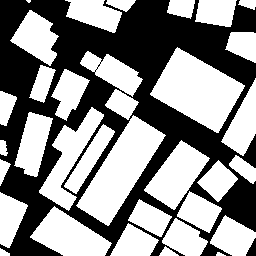

Predict IM


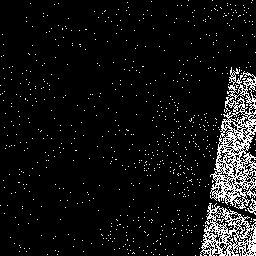

---------- data/images-256/mon_f15272_53_19_246420_252910.png ---------- 
 Real IM


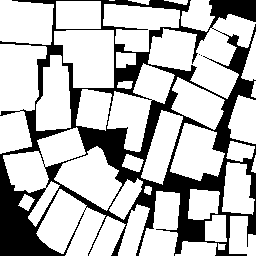

Predict IM


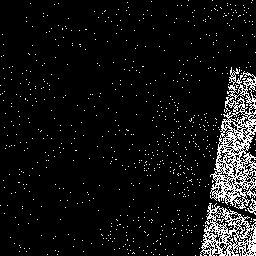

---------- data/images-256/mon_f15272_43_19_246422_252909.png ---------- 
 Real IM


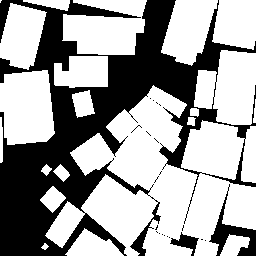

Predict IM


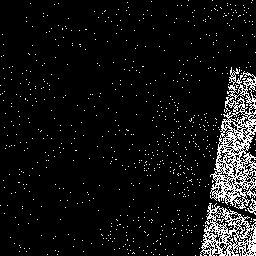

---------- data/images-256/mon_f15272_62_19_246418_252911.png ---------- 
 Real IM


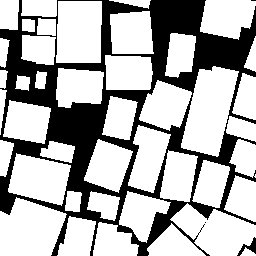

Predict IM


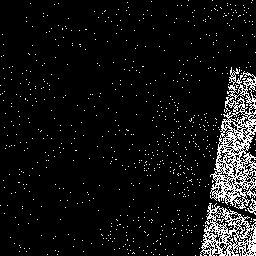

---------- data/images-256/mon_f15272_74_19_246420_252912.png ---------- 
 Real IM


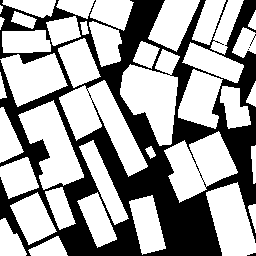

Predict IM


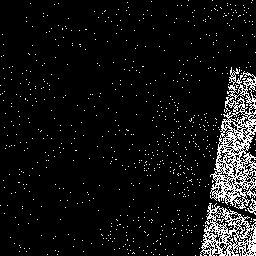

---------- data/images-256/mon_f15272_26_19_246417_252908.png ---------- 
 Real IM


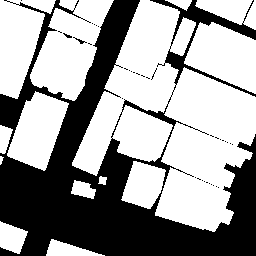

Predict IM


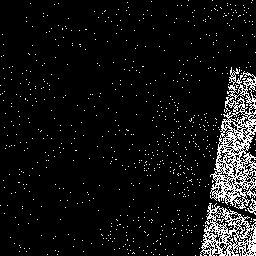

---------- data/images-256/mon_f15272_18_19_246421_252907.png ---------- 
 Real IM


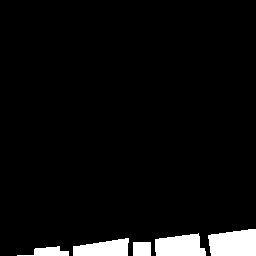

Predict IM


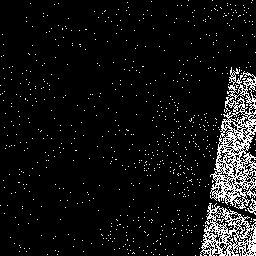

---------- data/images-256/mon_f15272_81_19_246419_252913.png ---------- 
 Real IM


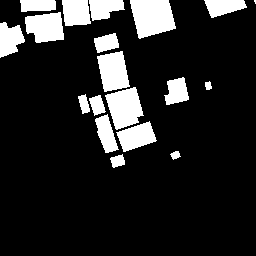

Predict IM


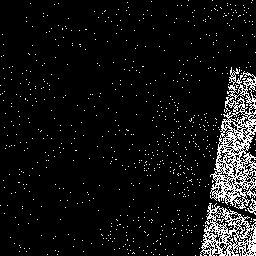

---------- data/images-256/mon_f15272_23_19_246414_252908.png ---------- 
 Real IM


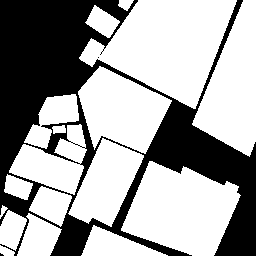

Predict IM


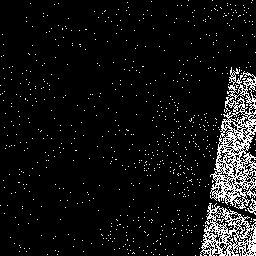

---------- data/images-256/mon_f15272_31_19_246422_252908.png ---------- 
 Real IM


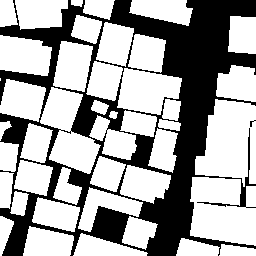

Predict IM


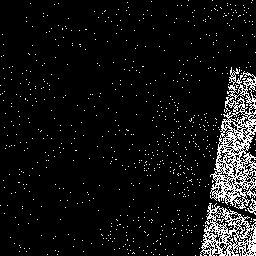

---------- data/images-256/mon_f15272_84_19_246418_252914.png ---------- 
 Real IM


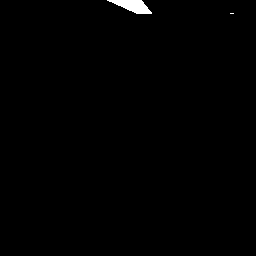

Predict IM


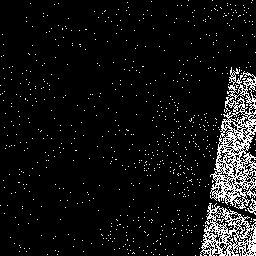

---------- data/images-256/mon_f15272_32_19_246423_252908.png ---------- 
 Real IM


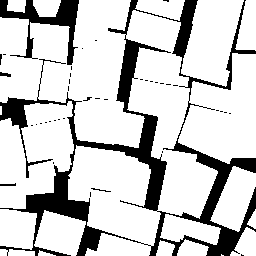

Predict IM


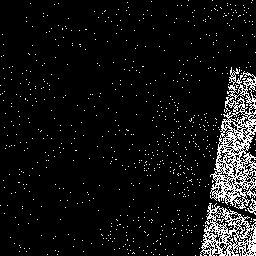

---------- data/images-256/mon_f15272_65_19_246421_252911.png ---------- 
 Real IM


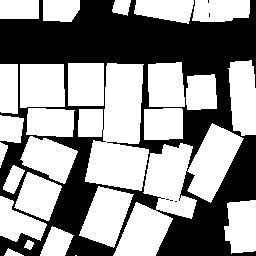

Predict IM


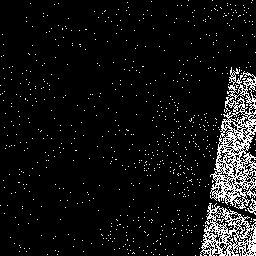

In [0]:
#Evaluate results
test_set = images[cutoff_point:]
def show_im_from_binary(data_bin):
  cv2_imshow( data_bin.reshape(256, 256)*255 )

def show_im_from_path(path):
  cv2_imshow( cv2.imread(path) )

X_test, Y_test = [], []
jaccards = []
for im in test_set:
  im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
  
  im_data = load_to_grayim(im).reshape(1, 65536)
  y_pred = model.predict(im_data).astype(int)

  im_mask_data = load_to_grayim(im_mask).reshape(1, 65536)
  y_true = np.where(im_mask_data == 255, 1, im_mask_data)
  # X_test.append(im_data)
  # Y_test.append(im_mask_data)

  jaccards.append( jaccard_score(y_true, y_pred, average= 'micro') )

  #Show real image and pred image
  print('-'*10, im, '-'*10, '\n Real IM')
  show_im_from_path( im_mask )
  print('Predict IM')
  show_im_from_binary(y_pred)
np.mean( jaccards )  

In [0]:
np.mean(jaccards)

0.06564840323828859

In [0]:
!pip install keras_segmentation

  Created wheel for keras-segmentation: filename=keras_segmentation-0.2.0-cp36-none-any.whl size=25696 sha256=4ebbafc0792112cdb3687337acdbd971d14bcbcce26830aa65bd33ee07150115
  Stored in directory: /root/.cache/pip/wheels/10/43/34/8d5a4aaa8d4479380c3aef57abf90ac47aa1e062c772defa39
Successfully built keras-segmentation


In [0]:
from keras_segmentation.models.unet import vgg_unet
# glob.glob('data/images-256/*.png')

model = vgg_unet(n_classes=51 ,  input_height=416, input_width=608  )

model.train(
    train_images =  'data/images-256/*.png',
    train_annotations = "data/masks-256/*.png",
    checkpoints_path = "data/masks-256/*.png" , epochs=5
)

out = model.predict_segmentation(
    inp="data/images-256/mon_f15272_0_19_246415_252904",
    out_fname="/tmp/out.png"
)

import matplotlib.pyplot as plt
plt.imshow(out)

# evaluating the model 
print(model.evaluate_segmentation( inp_images_dir="data/images-256/*.png"  , annotations_dir="data/masks-256/*.png" ) )

Verifying train dataset


AssertionError: ignored

In [0]:
np.mean(jaccards)

0.1686586746066554

In [0]:
y_pred.reshape(256, 256)*255

array([[  0., 255., 255., ...,   0.,   0.,   0.],
       [  0.,   0., 255., ..., 255., 255.,   0.],
       [255., 255.,   0., ..., 255., 255., 255.],
       ...,
       [  0., 255.,   0., ..., 255., 255., 255.],
       [  0., 255.,   0., ..., 255., 255., 255.],
       [  0.,   0., 255., ..., 255., 255., 255.]], dtype=float32)

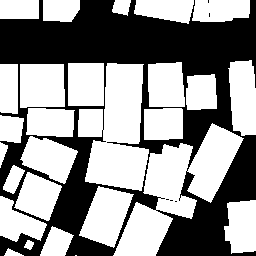

In [0]:
cv2_imshow( im_mask_data.reshape(256, 256) )

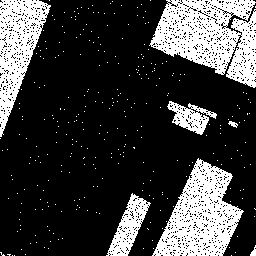

In [0]:
show_im_from_binary(y_pred)

In [0]:
from sklearn rủ.metrics import jaccard_score

array([[0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [0]:
# def load_to_grayim(im_path):
#   original_im = cv2.imread(im_path)
#   return cv2.cvtColor(original_im, cv2.COLOR_BGR2GRAY)
# im_data.reshape(65536,1)

In [0]:
im

In [0]:
cv2_imshow(cv2.imread(im_mask) )

In [0]:
cv2_imshow( cv2.cvtColor( cv2.imread(im_mask)  , cv2.COLOR_BGR2GRAY) )

In [0]:
print(cv2.cvtColor( cv2.imread(im_mask)  , cv2.COLOR_BGR2GRAY).shape)
print(cv2.imread(im_mask).shape )

# **20200217** Reload data

Lệnh chạy dữ liệu không hoạt động được do lỗi ở lib solaris --> load lại dữ liệu đã lưu trước đó

Test lại mô hình sử dụng CNN - UNet


In [0]:
#Reload saved data and libs
import cv2
from google.colab.patches import cv2_imshow #Cannot use cv2.imshow
from keras import Model
from keras.models import Sequential
# from keras.layers import Dense, Conv2D, Flatten, Dropout, Input,MaxPooling2D, concatenate, UpSampling2D, Lambda, Conv2DTranspose
from keras.layers import ( Input, Dense, Conv2D, MaxPooling2D, AveragePooling2D, ZeroPadding2D, 
                          Dropout, Flatten, Concatenate, concatenate, Reshape, Activation, Lambda, Conv2DTranspose )
from keras.layers.core import Layer
from keras import backend as K
import numpy as np

from google.colab import drive
drive.mount('/content/gdrive')
import glob, random
from sklearn.metrics import jaccard_score

Mounted at /content/gdrive


In [0]:
#Load data and train model 
def load_to_grayim(im_path):
  original_im = cv2.imread(im_path)
  return cv2.cvtColor(original_im, cv2.COLOR_BGR2GRAY)

def grayim_to_binary(im_array):
  return im_array/255

images = glob.glob('/content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/*.png')
cutoff_point = int(len(images)*0.75)
train_set = images[:cutoff_point]
test_set = images[cutoff_point:]

X, Y = [], []
for im in train_set:
  im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
  
  im_data = cv2.imread(im)
  # im_mask_data = cv2.imread(im_mask)
  #Chuyển thành dạng 0-1
  im_mask_data = load_to_grayim(im_mask)/255
  X.append(im_data)
  Y.append( im_mask_data) 

  # #Fit model
  # model.fit( im_data, im_mask_data )
  
X = np.array(X)
Y = np.array(Y).reshape(64,256,256,1)

In [0]:
Y = Y.reshape(64,256,256,1)

In [0]:
from keras import backend as K

In [0]:
# #Compile a funtional model
# input_height = 256
# input_width = 256

# img_input = Input(shape=(input_height,input_width , 3 ))

# conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(img_input)
# conv1 = Dropout(0.2)(conv1)
# conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
# pool1 = MaxPooling2D((2, 2))(conv1)

# conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
# conv2 = Dropout(0.2)(conv2)
# conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
# pool2 = MaxPooling2D((2, 2))(conv2)

# conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
# conv3 = Dropout(0.2)(conv3)
# conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)

# up1 = concatenate([UpSampling2D((2, 2))(conv3), conv2], axis=-1)
# conv4 = Conv2D(64, (3, 3), activation='relu', padding='same')(up1)
# conv4 = Dropout(0.2)(conv4)
# conv4 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv4)

# up2 = concatenate([UpSampling2D((2, 2))(conv4), conv1], axis=-1)
# conv5 = Conv2D(32, (3, 3), activation='relu', padding='same')(up2)
# conv5 = Dropout(0.2)(conv5)
# conv5 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv5)

# out = Conv2D( 3, (1, 1) , padding='same')(conv5)

# model = Model( inputs = img_input, outputs = out)
# model.compile(optimizer='adam', loss='mean_squared_error', metrics = ['mae', 'mse'])
# model.summary()

In [0]:
#Thấy người ta lm sao làm theo vậy
input_height = 256
input_width = 256
img_channels = 3

inputs = Input((input_height, input_width, img_channels))
s = Lambda(lambda x: x / 255) (inputs)

c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [0]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
lambda_4 (Lambda)               (None, 256, 256, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_49 (Conv2D)              (None, 256, 256, 16) 448         lambda_4[0][0]                   
__________________________________________________________________________________________________
dropout_24 (Dropout)            (None, 256, 256, 16) 0           conv2d_49[0][0]                  
____________________________________________________________________________________________

In [0]:
history = model.fit(X, Y, batch_size=1, epochs=50)

NameError: ignored

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_71_19_246417_252912.png ---------- 
 Real IM


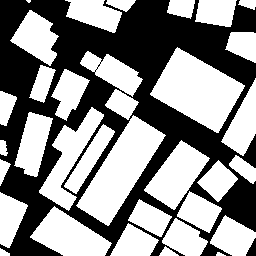

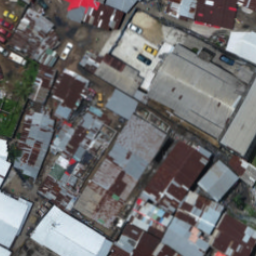

Predict IM


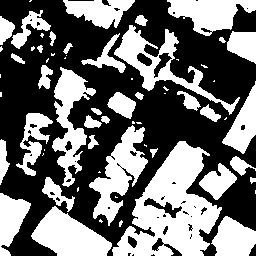

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_72_19_246418_252912.png ---------- 
 Real IM


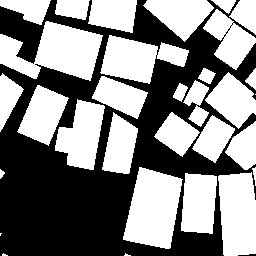

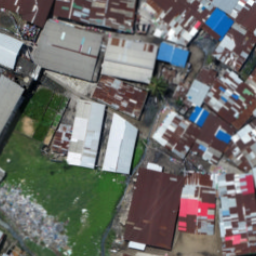

Predict IM


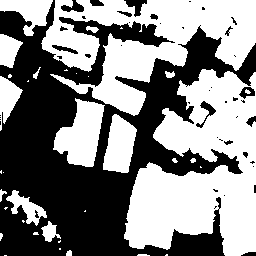

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_67_19_246423_252911.png ---------- 
 Real IM


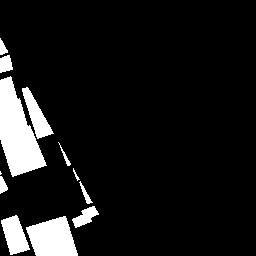

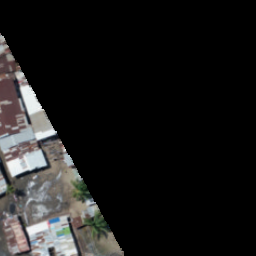

Predict IM


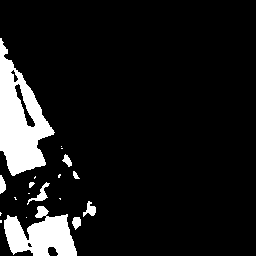

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_68_19_246414_252912.png ---------- 
 Real IM


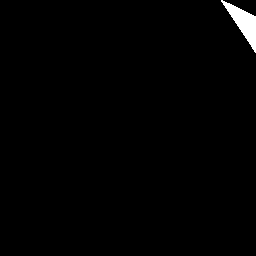

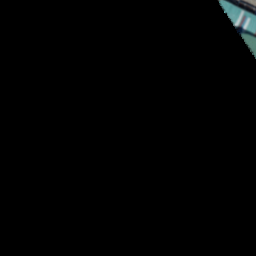

Predict IM


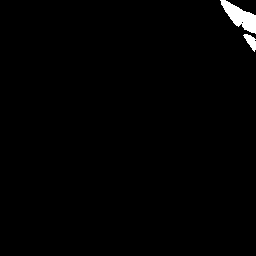

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_65_19_246421_252911.png ---------- 
 Real IM


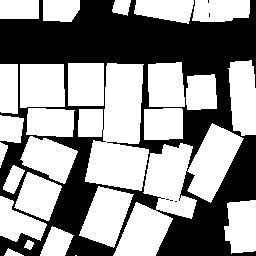

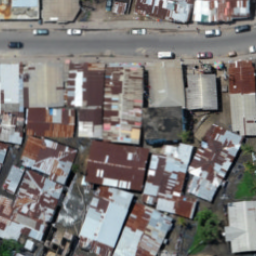

Predict IM


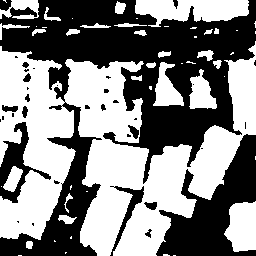

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_66_19_246422_252911.png ---------- 
 Real IM


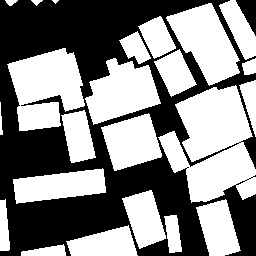

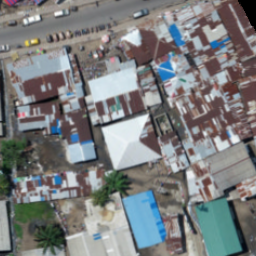

Predict IM


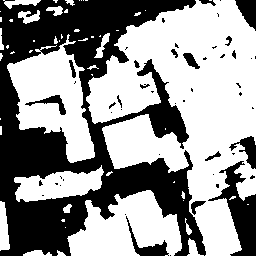

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_73_19_246419_252912.png ---------- 
 Real IM


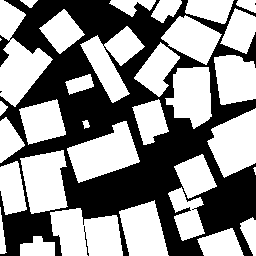

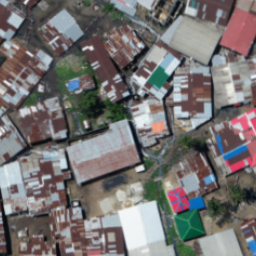

Predict IM


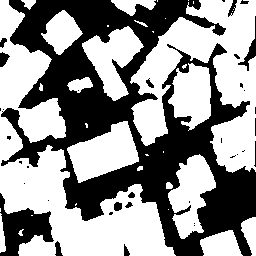

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_74_19_246420_252912.png ---------- 
 Real IM


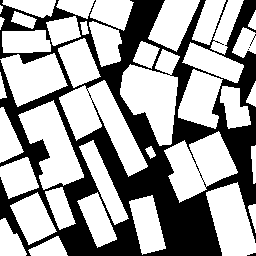

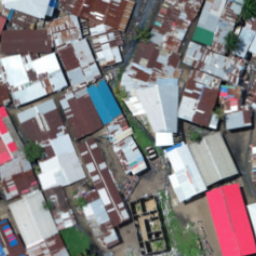

Predict IM


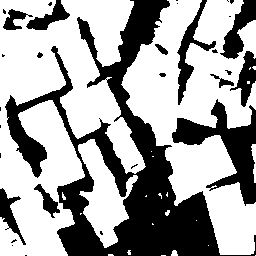

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_78_19_246416_252913.png ---------- 
 Real IM


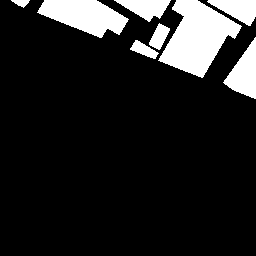

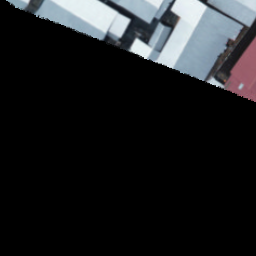

Predict IM


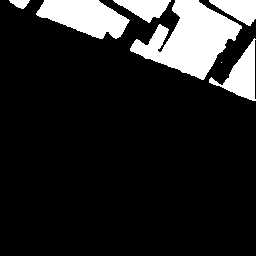

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_77_19_246423_252912.png ---------- 
 Real IM


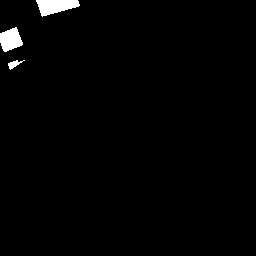

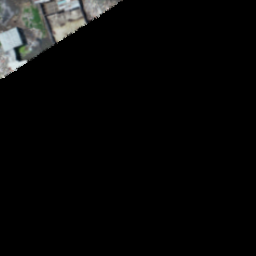

Predict IM


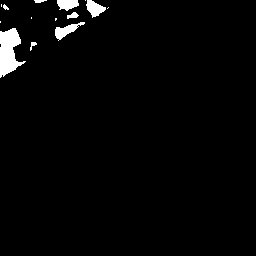

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_76_19_246422_252912.png ---------- 
 Real IM


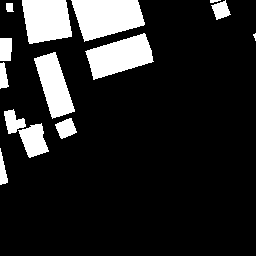

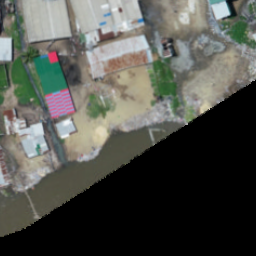

Predict IM


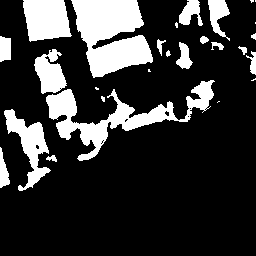

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_75_19_246421_252912.png ---------- 
 Real IM


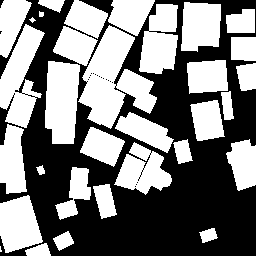

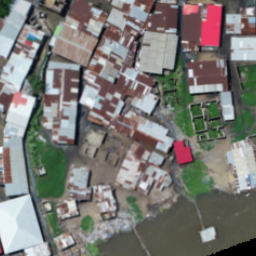

Predict IM


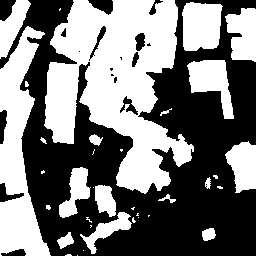

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_79_19_246417_252913.png ---------- 
 Real IM


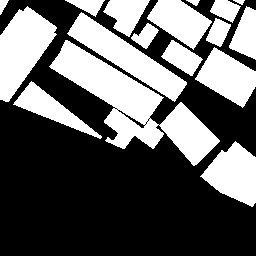

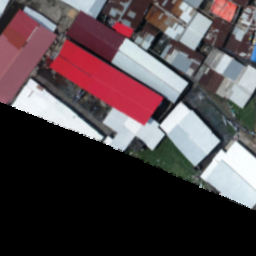

Predict IM


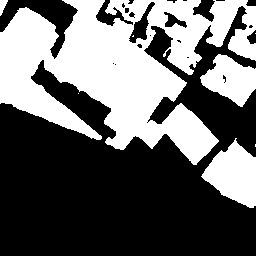

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_7_19_246414_252906.png ---------- 
 Real IM


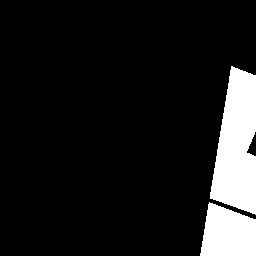

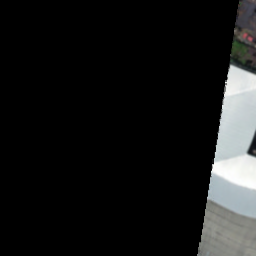

Predict IM


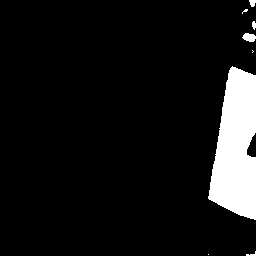

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_80_19_246418_252913.png ---------- 
 Real IM


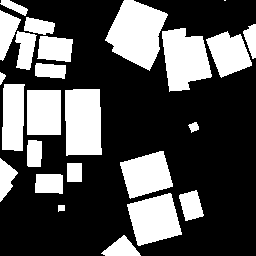

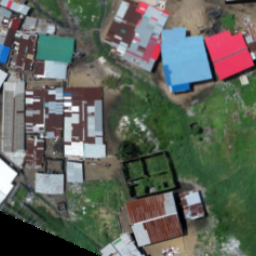

Predict IM


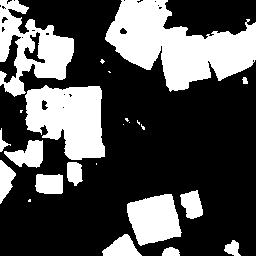

KeyboardInterrupt: ignored

In [0]:
#Evaluate results
test_set = images[cutoff_point:]
def show_im_from_binary(data_bin):
  cv2_imshow( data_bin.reshape(256, 256)*255 )

def show_im_from_path(path):
  cv2_imshow( cv2.imread(path) )

X_test, Y_test = [], []
jaccards = []
for im in test_set:
  im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
  
  im_data = np.array([cv2.imread(im)])
  # y_pred_color = model.predict(im_data)
  # y_pred = cv2.cvtColor(y_pred_color[0], cv2.COLOR_BGR2GRAY)
  # y_pred = np.around(y_pred)
  y_pred = np.around(model.predict(im_data))[0].reshape(256,256)

  im_mask_data = load_to_grayim(im_mask)
  y_true = im_mask_data/255
  # X_test.append(im_data)
  # Y_test.append(im_mask_data)

  jaccards.append( jaccard_score(y_true, y_pred, average= 'micro') )

  #Show real image and pred image
  print('-'*10, im, '-'*10, '\n Real IM')
  show_im_from_path( im_mask )
  show_im_from_path( im )
  print('Predict IM')
  cv2_imshow(y_pred*255)
np.mean( jaccards )  

# for im in train_set:
#   im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
  
#   im_data = cv2.imread(im)
#   # im_mask_data = cv2.imread(im_mask)
#   #Chuyển thành dạng 0-1
#   im_mask_data = load_to_grayim(im_mask)/255
#   X.append(im_data)
#   Y.append( im_mask_data) 

#   # #Fit model
#   # model.fit( im_data, im_mask_data )
  
# X = np.array(X)
# Y = np.array(Y).reshape(64,256,256,1)

In [0]:
np.mean( jaccards )  

0.6533645906177893

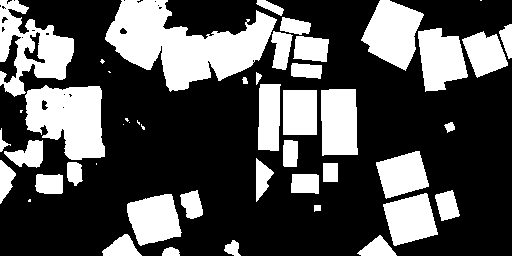

In [0]:
  # print('-'*10, im, '-'*10, '\n Real IM')
  # show_im_from_path( im_mask )
  # show_im_from_path( im )
  # print('Predict IM')
  # cv2_imshow(y_pred*255)
  cv2_imshow( np.concatenate( ( y_pred*255, im_mask_data ), axis= 1 ) )
  # (y_pred*255).shape

In [0]:
np.mean( jaccards )  

0.5056209050623429

In [0]:
# model.predict(im_data)
# cv2.cvtColor(y_pred_color[0], cv2.COLOR_BGR2GRAY)
# cv2.cvtColor(y_pred_color[0], cv2.COLOR_RGB2GRAY)
# jaccard_score(y_true, y_pred, average= 'micro')
# y_true.shape
# cv2.imread('/content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_81_19_246419_252913.png')

In [0]:
# cv2_imshow(y_pred_color[0])
# cv2_imshow( y_pred_color[0]*255 )
# cv2_imshow( y_true )
y_pred_color

array([[[[0.27776253, 0.2933092 , 0.22743043],
         [0.17781776, 0.21181774, 0.11374572],
         [0.17001903, 0.1998854 , 0.08590841],
         ...,
         [0.45221794, 0.5338572 , 0.48537064],
         [0.3704037 , 0.51101106, 0.47216323],
         [0.41262847, 0.5784885 , 0.54468215]],

        [[0.20899251, 0.21730748, 0.21598312],
         [0.13041174, 0.13043028, 0.08670461],
         [0.13572302, 0.12917194, 0.09081551],
         ...,
         [0.51849854, 0.59659207, 0.5356842 ],
         [0.4884549 , 0.4726387 , 0.60560596],
         [0.39306855, 0.5028562 , 0.4697734 ]],

        [[0.29754186, 0.22937468, 0.20978212],
         [0.11891726, 0.12957686, 0.07465231],
         [0.1531479 , 0.15775639, 0.09938538],
         ...,
         [0.62482077, 0.64328897, 0.6381822 ],
         [0.59124345, 0.55789167, 0.5879204 ],
         [0.44391495, 0.60547847, 0.63583016]],

        ...,

        [[0.6846634 , 0.6332934 , 0.57789135],
         [0.8100585 , 0.8546625 , 0.8469887 ]

Sử dụng Inception network cơ bản tự đề xuất

In [0]:
from keras.layers import concatenate

In [0]:
def incep_block1(input_layer, block_name='inception_1'):
	'''Dựng inception block cơ bản'''
	with K.name_scope(block_name):
		con1 = Conv2D(32, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (input_layer)
		con2_1 = Conv2D(16, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (input_layer)
		con2_2 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (con2_1)
		# dop1 = Dropout(0.1) (c1)
		con3_1 = Conv2D(16, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (input_layer)
		con3_2 = Conv2D(32, (5, 5), activation='relu', kernel_initializer='he_normal', padding='same') (con3_1)
		poo1 = MaxPooling2D((2, 2), strides = 1, padding='same') (input_layer)
		con4 = Conv2D(16, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (poo1)
		concat_layer = Concatenate(axis=-1)([con1,con2_2,con3_2,con4])
		output_layer = MaxPooling2D((2, 2), strides = (2,2)) (concat_layer)
	return output_layer

In [0]:
K.set_image_data_format('channels_last')

input_height = 256
input_width = 256
img_channels = 3

inputs = Input((input_height, input_width, img_channels))
incep1 = incep_block1(inputs, 'incep1')
incep2 = incep_block1(incep1, 'incep2')
incep3 = incep_block1(incep2, 'incep3')
incep4 = incep_block1(incep3, 'incep4')
incep5 = incep_block1(incep4, 'incep5')

outputs = Conv2D(1, (1, 1), activation='softmax', kernel_initializer='he_normal', padding='same') (incep5)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [0]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_182 (Conv2D)             (None, 256, 256, 16) 64          input_22[0][0]                   
__________________________________________________________________________________________________
conv2d_184 (Conv2D)             (None, 256, 256, 16) 64          input_22[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_32 (MaxPooling2D) (None, 256, 256, 3)  0           input_22[0][0]                   
____________________________________________________________________________________________

In [0]:
history = model.fit(X, Y, batch_size=1, epochs=5)

ValueError: ignored

In [0]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_151 (Conv2D)             (None, 256, 256, 16) 64          input_20[0][0]                   
__________________________________________________________________________________________________
conv2d_153 (Conv2D)             (None, 256, 256, 16) 64          input_20[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_27 (MaxPooling2D) (None, 256, 256, 3)  0           input_20[0][0]                   
____________________________________________________________________________________________

### Thử mô hình Unet kết hợp inception block, 
Thay các convolution layer từ mạng Unet bằng các inception *block*

In [0]:
def incep_block1(input_layer, block_name='inception_1', block_unit_size = 16):
	'''Dựng inception block cơ bản'''
	with K.name_scope(block_name):
		con1_1 = Conv2D( block_unit_size*2 , (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (input_layer)
		con1_2 = Dropout(0.4) (con1_1)
		con2_1 = Conv2D( block_unit_size*2, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (input_layer)
		con2_2 = Dropout(0.4) (con2_1)
		con2_3 = Conv2D(block_unit_size, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (con2_2)
		con3_1 = Conv2D(block_unit_size*2, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (input_layer)
		con3_2 = Dropout(0.4) (con3_1)
		con3_3 = Conv2D(block_unit_size, (5, 5), activation='relu', kernel_initializer='he_normal', padding='same') (con3_2)
		poo1 = MaxPooling2D((2, 2),strides = 1, padding='same') (input_layer)
		con4_1 = Conv2D(block_unit_size, (1, 1), activation='relu', kernel_initializer='he_normal', padding='same') (poo1)
		con4_2 = Dropout(0.2) (con4_1)

		output_layer = Concatenate(axis=-1)([con1_2,con2_3,con3_3,con4_2])
	return output_layer

#Unet, thay conv bằng 1 inception module
input_height = 256
input_width = 256
img_channels = 3

inputs = Input((input_height, input_width, img_channels))
#Chia tất cả giá trị cho 255 --> normalise về dạng 0-1
s = Lambda(lambda x: x / 255) (inputs)

c1 = incep_block1(s, 'inception_1', block_unit_size = 16)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = incep_block1(p1, 'inception_2', block_unit_size = 32)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = incep_block1(p2, 'inception_3', block_unit_size = 64)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = incep_block1(p3, 'inception_4', block_unit_size = 128)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = incep_block1(p4, 'inception_5', block_unit_size = 256)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = incep_block1(u6, 'inception_6', block_unit_size = 128)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = incep_block1(u7, 'inception_7', block_unit_size = 64)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = incep_block1(u8, 'inception_8', block_unit_size = 32)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = incep_block1(u9, 'inception_9', block_unit_size = 16)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [0]:
def evaluate_results(model , test_set ):
		#Evaluate results
	# test_set = images[cutoff_point:]
	def show_im_from_binary(data_bin):
	  cv2_imshow( data_bin.reshape(256, 256)*255 )

	def show_im_from_path(path):
	  cv2_imshow( cv2.imread(path) )

	# X_test, Y_test = [], []
	jaccards = []
	for im in test_set:
	  im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
	  
	  im_data = np.array([cv2.imread(im)])
	  # y_pred_color = model.predict(im_data)
	  # y_pred = cv2.cvtColor(y_pred_color[0], cv2.COLOR_BGR2GRAY)
	  # y_pred = np.around(y_pred)
	  y_pred = np.around(model.predict(im_data))[0].reshape(256,256)

	  im_mask_data = load_to_grayim(im_mask)
	  y_true = im_mask_data/255
	  # X_test.append(im_data)
	  # Y_test.append(im_mask_data)

	  jaccards.append( jaccard_score(y_true, y_pred, average= 'micro') )

	  #Show real image and pred image
	  print('-'*10, im, '-'*10, '\n Real IM')
	  show_im_from_path( im_mask )
	  show_im_from_path( im )
	  print('Predict IM')
	  cv2_imshow(y_pred*255)
	return np.mean( jaccards )  

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_71_19_246417_252912.png ---------- 
 Real IM


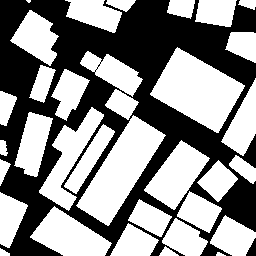

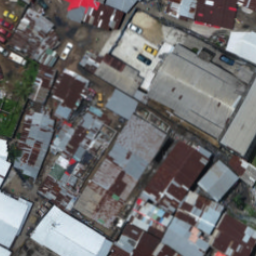

Predict IM


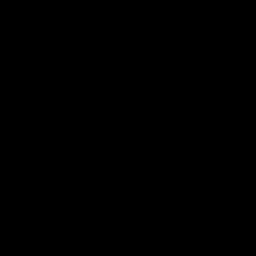

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_72_19_246418_252912.png ---------- 
 Real IM


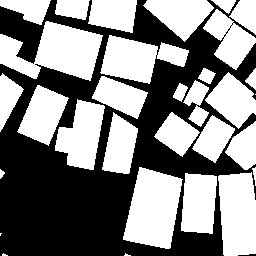

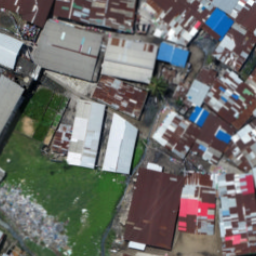

Predict IM


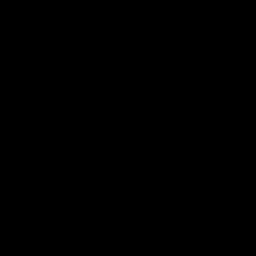

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_67_19_246423_252911.png ---------- 
 Real IM


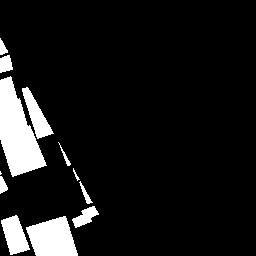

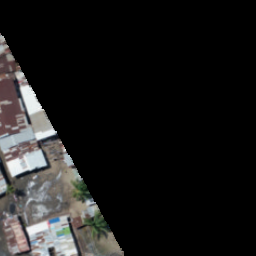

Predict IM


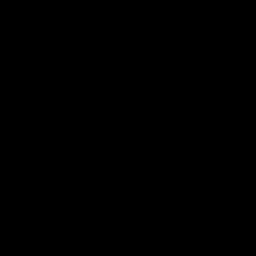

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_68_19_246414_252912.png ---------- 
 Real IM


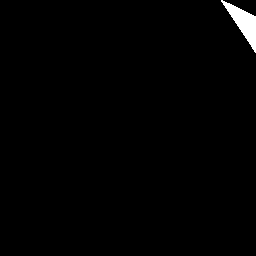

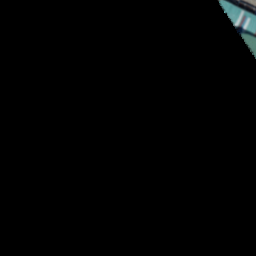

Predict IM


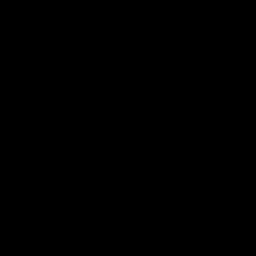

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_65_19_246421_252911.png ---------- 
 Real IM


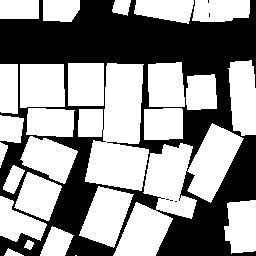

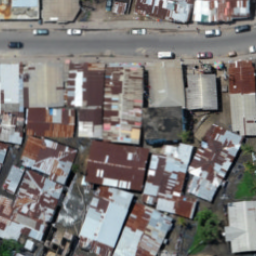

Predict IM


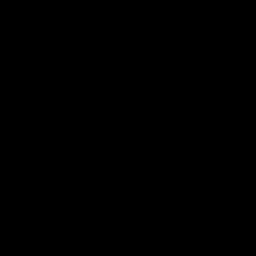

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_66_19_246422_252911.png ---------- 
 Real IM


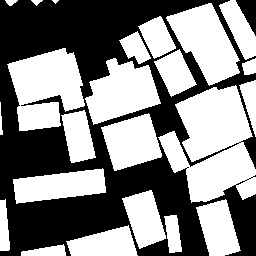

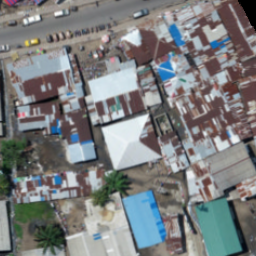

Predict IM


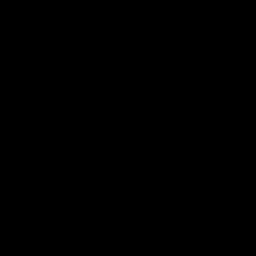

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_73_19_246419_252912.png ---------- 
 Real IM


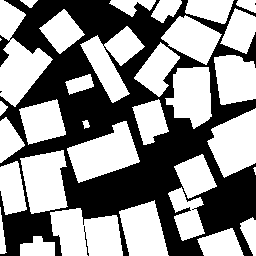

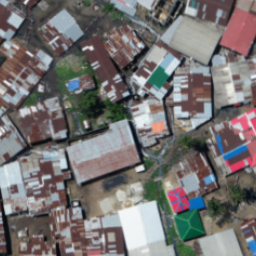

Predict IM


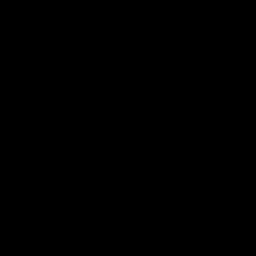

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_74_19_246420_252912.png ---------- 
 Real IM


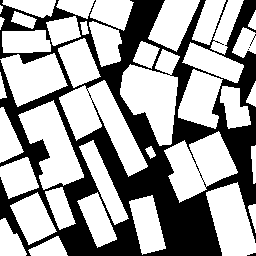

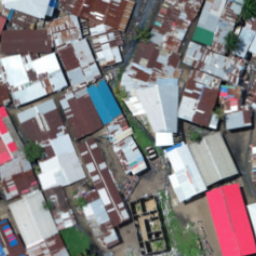

Predict IM


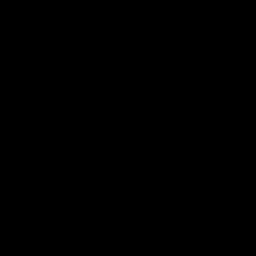

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_78_19_246416_252913.png ---------- 
 Real IM


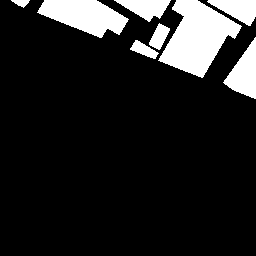

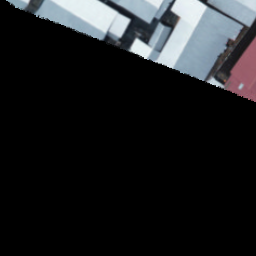

Predict IM


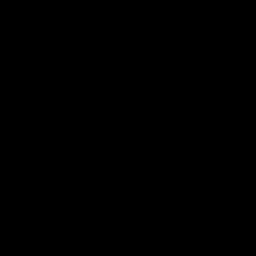

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_77_19_246423_252912.png ---------- 
 Real IM


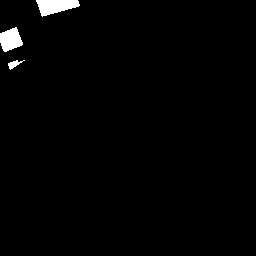

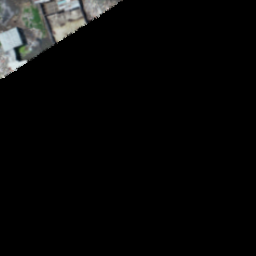

Predict IM


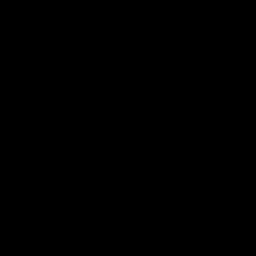

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_76_19_246422_252912.png ---------- 
 Real IM


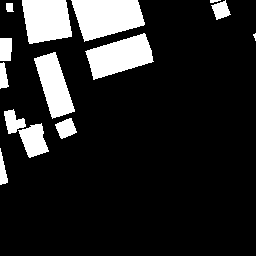

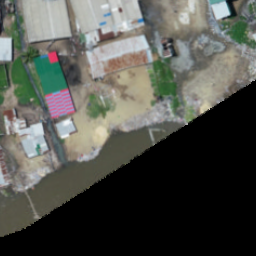

Predict IM


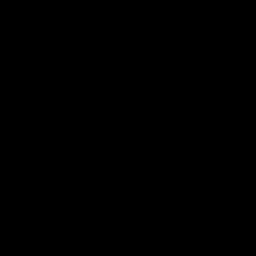

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_75_19_246421_252912.png ---------- 
 Real IM


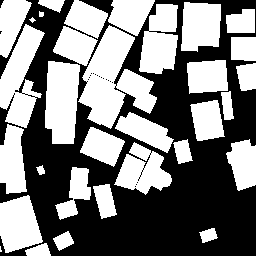

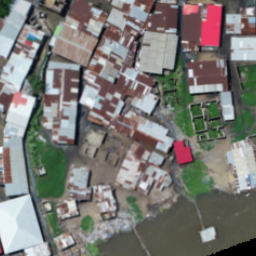

Predict IM


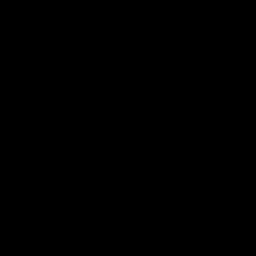

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_79_19_246417_252913.png ---------- 
 Real IM


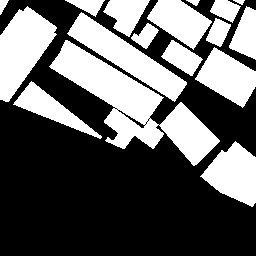

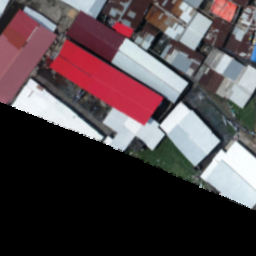

Predict IM


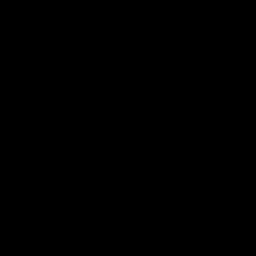

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_7_19_246414_252906.png ---------- 
 Real IM


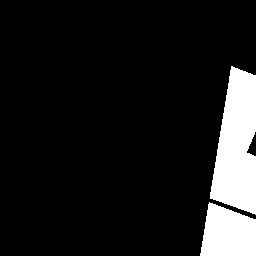

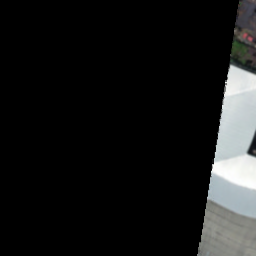

Predict IM


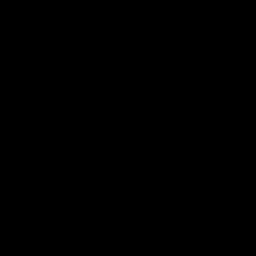

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_80_19_246418_252913.png ---------- 
 Real IM


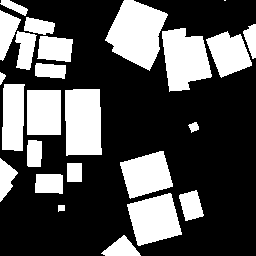

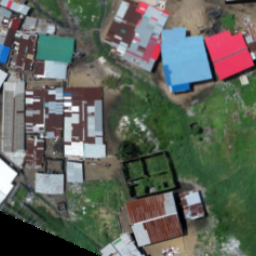

Predict IM


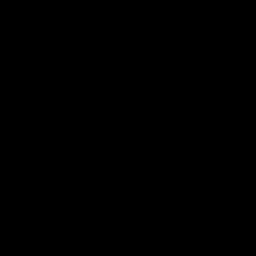

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_82_19_246420_252913.png ---------- 
 Real IM


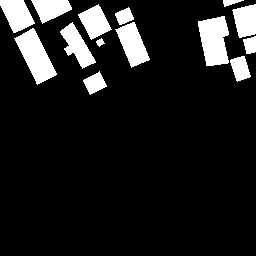

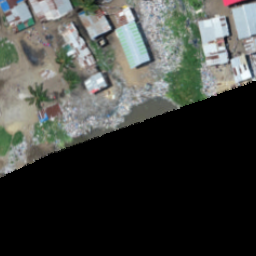

Predict IM


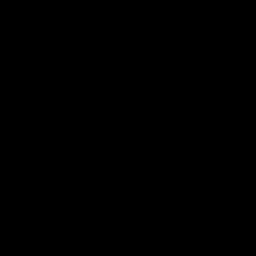

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_81_19_246419_252913.png ---------- 
 Real IM


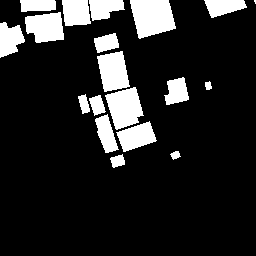

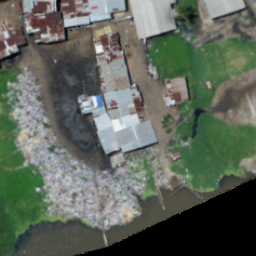

Predict IM


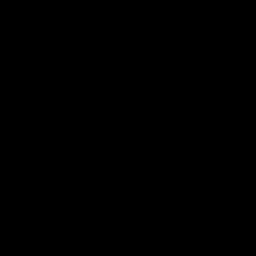

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_83_19_246421_252913.png ---------- 
 Real IM


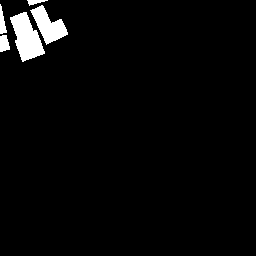

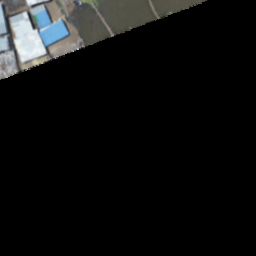

Predict IM


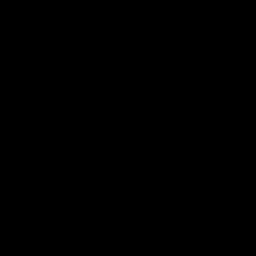

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_84_19_246418_252914.png ---------- 
 Real IM


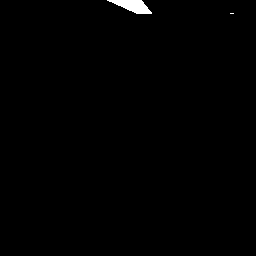

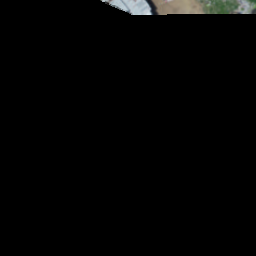

Predict IM


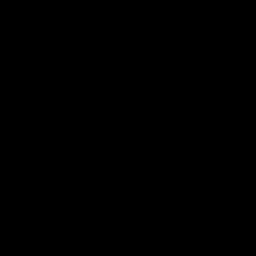

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_8_19_246415_252906.png ---------- 
 Real IM


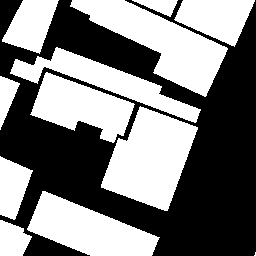

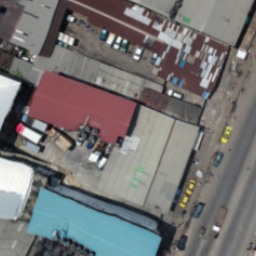

Predict IM


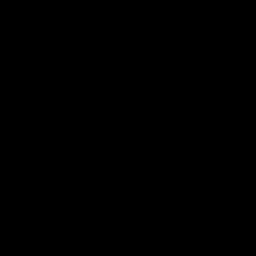

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_9_19_246416_252906.png ---------- 
 Real IM


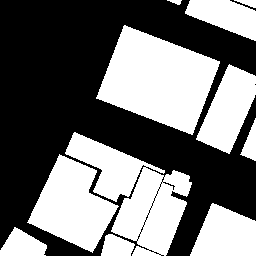

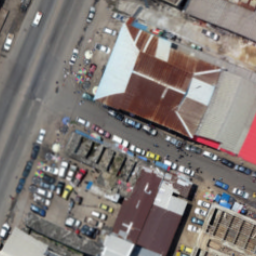

Predict IM


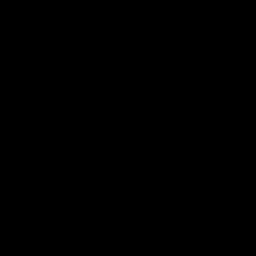

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_85_19_246419_252914.png ---------- 
 Real IM


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Jaccard is ill-defined and being set to 0.0 due to no true or predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


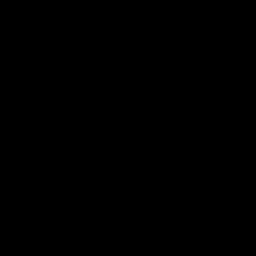

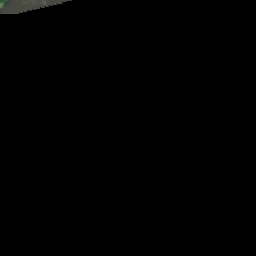

Predict IM


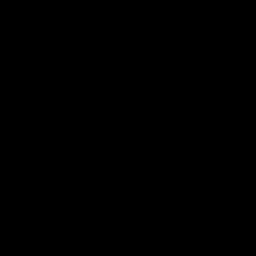

In [0]:
jaccards = evaluate_results(model, test_set)

# Train

In [0]:
#6:39 AM
#8:39PM - epoch 7 start
for i in range(10):
  history = model.fit(X, Y, batch_size=1, epochs=10)
  #Save model
  model.save('/content/gdrive/My Drive/Colab_Notebooks/competitions/model/20200223_unet_inception_net_with_dropout.h5')

Epoch 1/5
64/64 [==============================] - 157s 2s/step - loss: 0.1124 - acc: 0.9543
Epoch 2/5
64/64 [==============================] - 155s 2s/step - loss: 0.1108 - acc: 0.9546
Epoch 3/5
64/64 [==============================] - 156s 2s/step - loss: 0.1099 - acc: 0.9552
Epoch 4/5
64/64 [==============================] - 153s 2s/step - loss: 0.1155 - acc: 0.9531
Epoch 5/5
64/64 [==============================] - 152s 2s/step - loss: 0.1106 - acc: 0.9551
Epoch 1/5
64/64 [==============================] - 156s 2s/step - loss: 0.1071 - acc: 0.9567
Epoch 2/5
64/64 [==============================] - 153s 2s/step - loss: 0.1070 - acc: 0.9563
Epoch 3/5
64/64 [==============================] - 153s 2s/step - loss: 0.1053 - acc: 0.9568
Epoch 4/5
64/64 [==============================] - 153s 2s/step - loss: 0.1013 - acc: 0.9585
Epoch 5/5
64/64 [==============================] - 153s 2s/step - loss: 0.1025 - acc: 0.9584
Epoch 1/5
64/64 [==============================] - 155s 2s/step - loss

In [0]:
#Save model
model.save('/content/gdrive/My Drive/Colab_Notebooks/competitions/model/my_model.h5')

In [0]:
# Recreate the exact same model, including weights and optimizer.
from keras.models import load_model
model = load_model('/content/gdrive/My Drive/Colab_Notebooks/competitions/model/20200223_unet_inception_net.h5')
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 256, 256, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 128         lambda_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 256, 256, 32) 128         lambda_1[0][0]                   
____________________________________________________________________________________________

# Test results

---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_0_19_246415_252904.png ---------- 
 Real IM


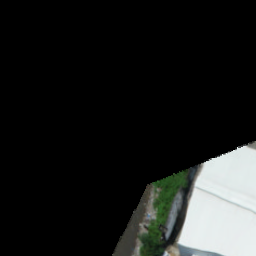

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_12_19_246415_252907.png ---------- 
 Real IM


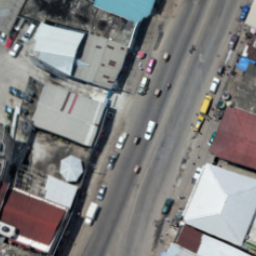

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_11_19_246414_252907.png ---------- 
 Real IM


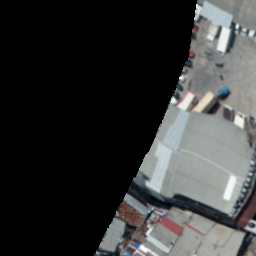

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_17_19_246420_252907.png ---------- 
 Real IM


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Jaccard is ill-defined and being set to 0.0 due to no true or predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


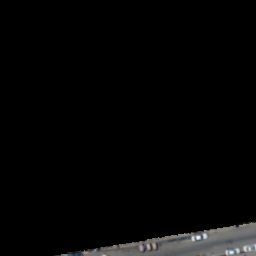

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_18_19_246421_252907.png ---------- 
 Real IM


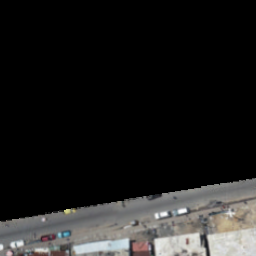

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_16_19_246419_252907.png ---------- 
 Real IM


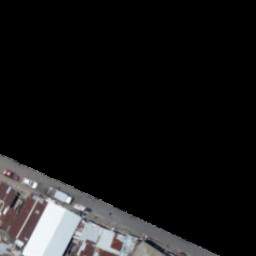

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_10_19_246417_252906.png ---------- 
 Real IM


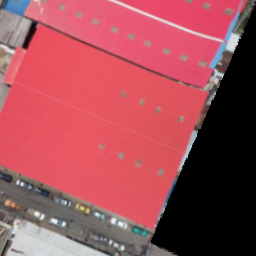

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_14_19_246417_252907.png ---------- 
 Real IM


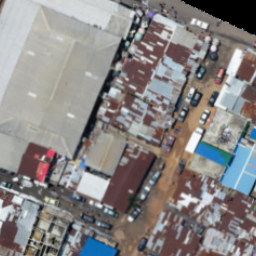

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_13_19_246416_252907.png ---------- 
 Real IM


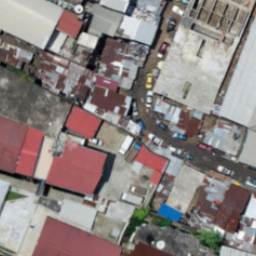

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_15_19_246418_252907.png ---------- 
 Real IM


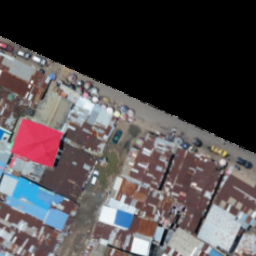

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_19_19_246422_252907.png ---------- 
 Real IM


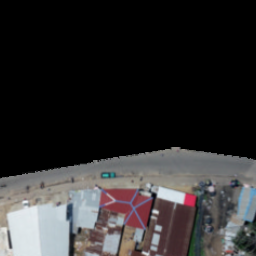

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_1_19_246416_252904.png ---------- 
 Real IM


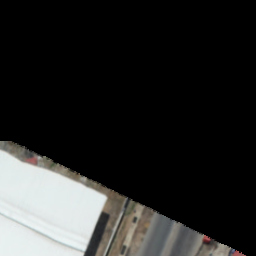

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_20_19_246423_252907.png ---------- 
 Real IM


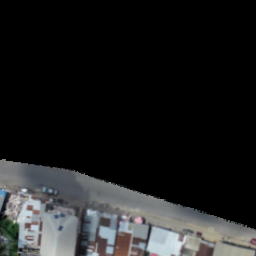

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_21_19_246424_252907.png ---------- 
 Real IM


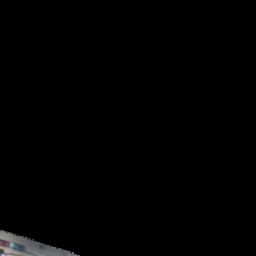

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_25_19_246416_252908.png ---------- 
 Real IM


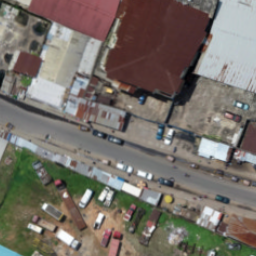

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_24_19_246415_252908.png ---------- 
 Real IM


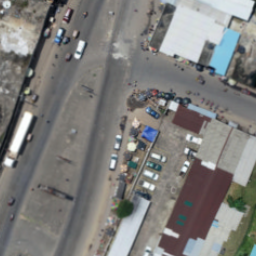

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_27_19_246418_252908.png ---------- 
 Real IM


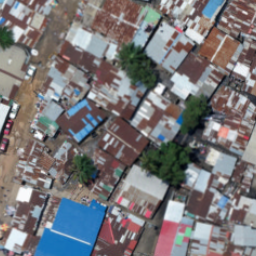

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_23_19_246414_252908.png ---------- 
 Real IM


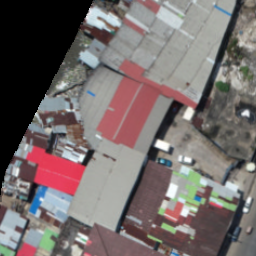

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_22_19_246413_252908.png ---------- 
 Real IM


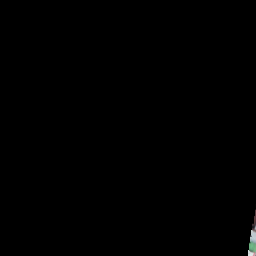

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_26_19_246417_252908.png ---------- 
 Real IM


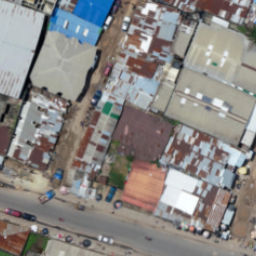

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_28_19_246419_252908.png ---------- 
 Real IM


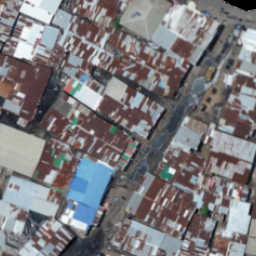

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_29_19_246420_252908.png ---------- 
 Real IM


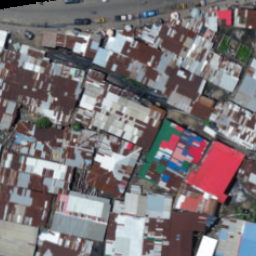

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_2_19_246414_252905.png ---------- 
 Real IM


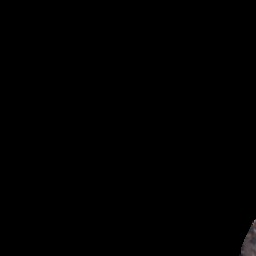

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_30_19_246421_252908.png ---------- 
 Real IM


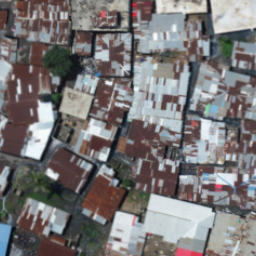

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_31_19_246422_252908.png ---------- 
 Real IM


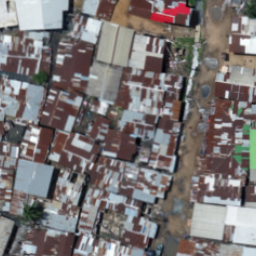

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_32_19_246423_252908.png ---------- 
 Real IM


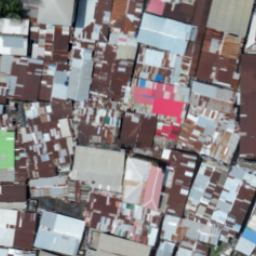

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_33_19_246424_252908.png ---------- 
 Real IM


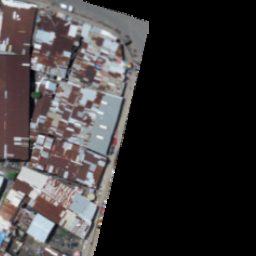

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_34_19_246413_252909.png ---------- 
 Real IM


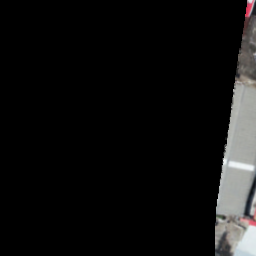

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_35_19_246414_252909.png ---------- 
 Real IM


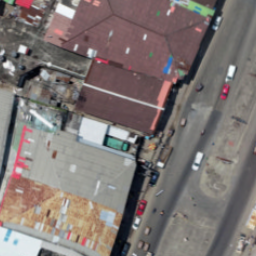

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_36_19_246415_252909.png ---------- 
 Real IM


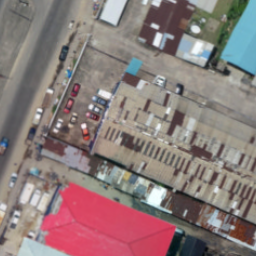

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_37_19_246416_252909.png ---------- 
 Real IM


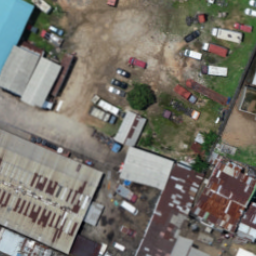

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_38_19_246417_252909.png ---------- 
 Real IM


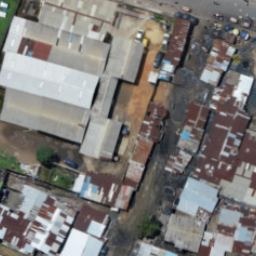

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_39_19_246418_252909.png ---------- 
 Real IM


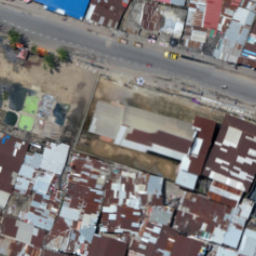

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_3_19_246415_252905.png ---------- 
 Real IM


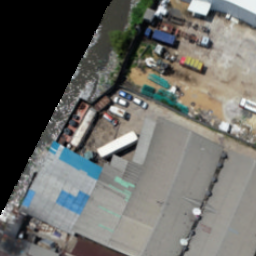

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_40_19_246419_252909.png ---------- 
 Real IM


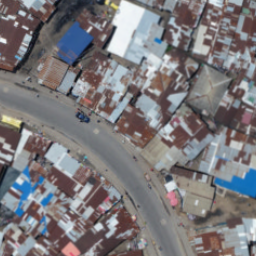

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_41_19_246420_252909.png ---------- 
 Real IM


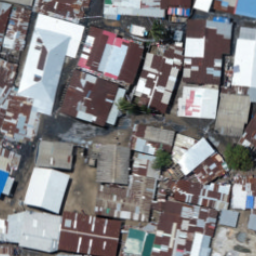

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_42_19_246421_252909.png ---------- 
 Real IM


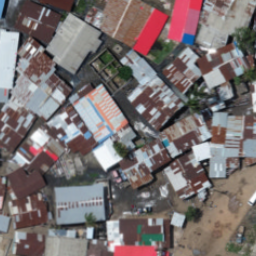

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_43_19_246422_252909.png ---------- 
 Real IM


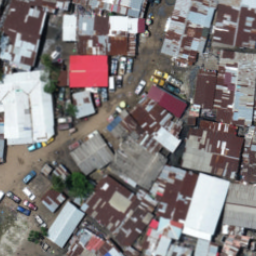

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_44_19_246423_252909.png ---------- 
 Real IM


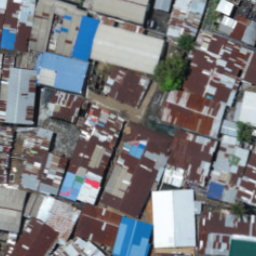

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_45_19_246424_252909.png ---------- 
 Real IM


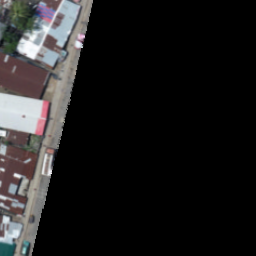

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_46_19_246413_252910.png ---------- 
 Real IM


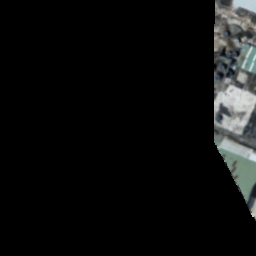

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_47_19_246414_252910.png ---------- 
 Real IM


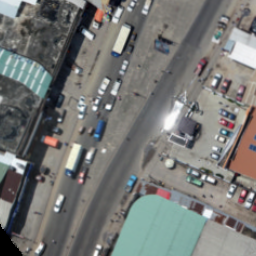

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_48_19_246415_252910.png ---------- 
 Real IM


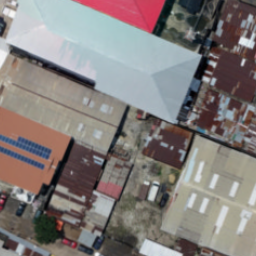

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_49_19_246416_252910.png ---------- 
 Real IM


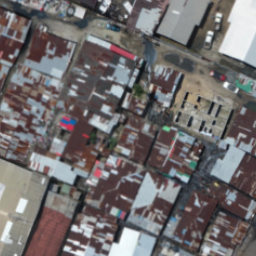

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_4_19_246416_252905.png ---------- 
 Real IM


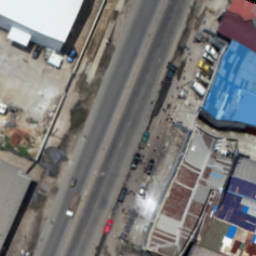

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_50_19_246417_252910.png ---------- 
 Real IM


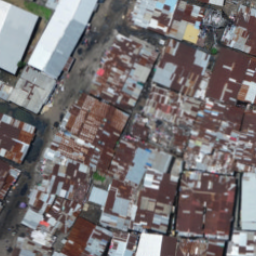

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_51_19_246418_252910.png ---------- 
 Real IM


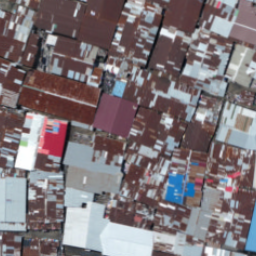

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_52_19_246419_252910.png ---------- 
 Real IM


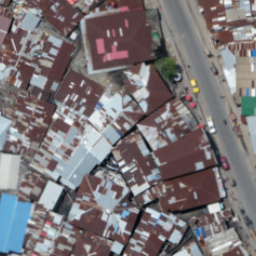

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_53_19_246420_252910.png ---------- 
 Real IM


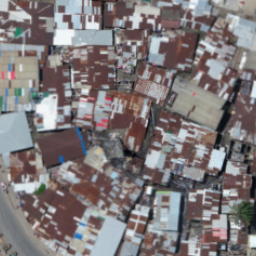

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_54_19_246421_252910.png ---------- 
 Real IM


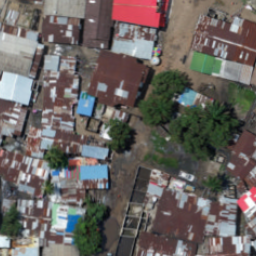

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_55_19_246422_252910.png ---------- 
 Real IM


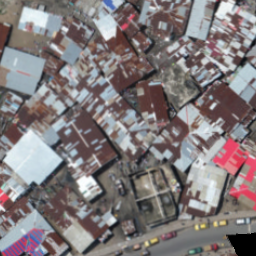

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_5_19_246417_252905.png ---------- 
 Real IM


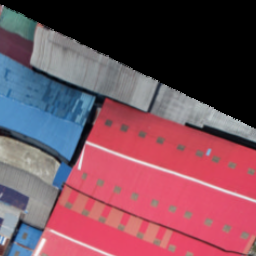

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_57_19_246424_252910.png ---------- 
 Real IM


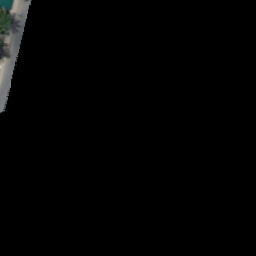

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_56_19_246423_252910.png ---------- 
 Real IM


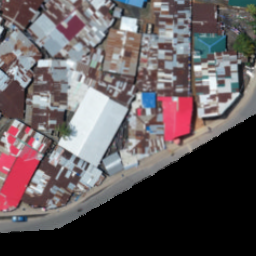

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_59_19_246415_252911.png ---------- 
 Real IM


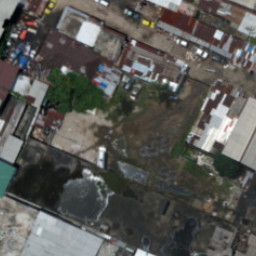

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_58_19_246414_252911.png ---------- 
 Real IM


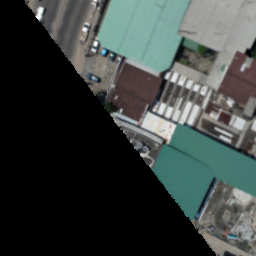

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_63_19_246419_252911.png ---------- 
 Real IM


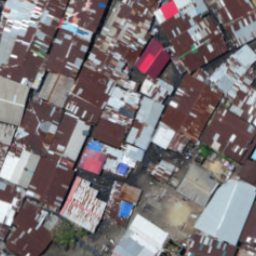

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_60_19_246416_252911.png ---------- 
 Real IM


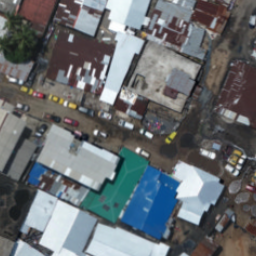

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_61_19_246417_252911.png ---------- 
 Real IM


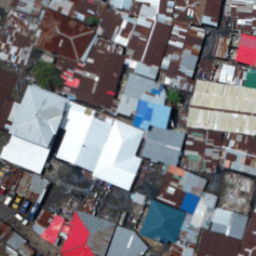

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_62_19_246418_252911.png ---------- 
 Real IM


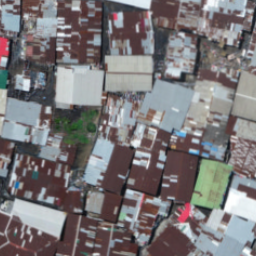

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_64_19_246420_252911.png ---------- 
 Real IM


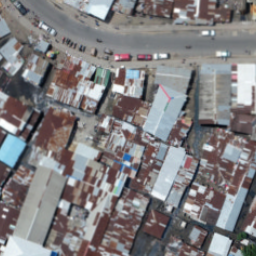

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_69_19_246415_252912.png ---------- 
 Real IM


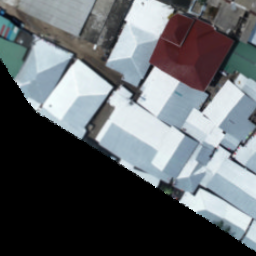

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_6_19_246418_252905.png ---------- 
 Real IM


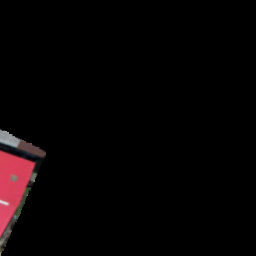

Predi#t IM
---------- /content/gdrive/My Drive/Colab_Notebooks/competitions/data/images-256/mon_f15272_70_19_246416_252912.png ---------- 
 Real IM


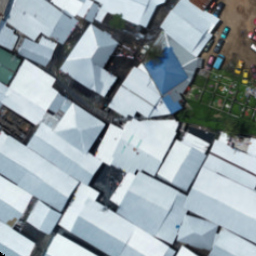

Predi#t IM


0.8062039744100236

In [0]:
# test_set = images[cutoff_point:]
def show_im_from_binary(data_bin):
  cv2_imshow( data_bin.reshape(256, 256)*255 )

def show_im_from_path(path):
  cv2_imshow( cv2.imread(path) )

# X_test, Y_test = [], []
jaccards = []
for im in train_set:#tintesttes_set:
  im_mask =  im.replace('images', 'masks').replace('.png', '_mask.png')
  
  im_data = np.array([cv2.imread(im)])
  # y_pred_color = model.predict(im_data)
  # y_pred = cv2.cvtColor(y_pred_color[0], cv2.COLOR_BGR2GRAY)
  # y_pred = np.around(y_pred)
  y_pred = np.around(model.predict(im_data))[0].reshape(256,256)

  im_mask_data = load_to_grayim(im_mask)
  y_true = im_mask_data/255
  # X_test.append(im_data)
  # Y_test.append(im_mask_data)

  jaccards.append( jaccard_score(y_true, y_pred, average= 'micro') )
#-'micro'
  #Show real image and pred image
  print('-'*10, im, '-'*10, '\n Real IM')
  show_im_from_path( im )
  # show_im_from_path( im_mask )
  print('Predi#t IM')
 #- # --cv2_imshow(y_pred*255)
  # cv2_imshow( np.concatenate( ( im_mask, y_pred*255 ), axis= 1 ) )
np.mean( jaccards )  

In [0]:
np.mean(y_pred)

0.0

### Sử dụng GooleNet, không giảm kích thước mạng

In [0]:
from keras.regularizers import l2
from keras import backend as K
import tensorflow as tf
class LRN(Layer):

    def __init__(self, alpha=0.0001, k=1, beta=0.75, n=5, **kwargs):
        self.alpha = alpha
        self.k = k
        self.beta = beta
        self.n = n
        super(LRN, self).__init__(**kwargs)

    def call(self, x, mask=None):
        b, ch, r, c = x.shape
        half_n = self.n // 2 # half the local region
        input_sqr = K.square(x) # square the input
        if K.backend() == 'theano':
            # make an empty tensor with zero pads along channel dimension
            zeros = T.alloc(0., b, ch + 2*half_n, r, c)
            # set the center to be the squared input
            input_sqr = T.set_subtensor(zeros[:, half_n:half_n+ch, :, :], input_sqr)
        else:
            input_sqr = tf.pad(input_sqr, [[0, 0], [half_n, half_n], [0, 0], [0, 0]])
        scale = self.k # offset for the scale
        norm_alpha = self.alpha / self.n # normalized alpha
        for i in range(self.n):
            scale += norm_alpha * input_sqr[:, i:i+ch, :, :]
        scale = scale ** self.beta
        x = x / scale
        return x

    def get_config(self):
        config = {"alpha": self.alpha,
                  "k": self.k,
                  "beta": self.beta,
                  "n": self.n}
        base_config = super(LRN, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


In [0]:
class PoolHelper(Layer):

    def __init__(self, **kwargs):
        super(PoolHelper, self).__init__(**kwargs)

    def call(self, x, mask=None):
        return x[:,:,1:,1:]

    def get_config(self):
        config = {}
        base_config = super(PoolHelper, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


input = Input(shape=(3, 224, 224))

input_pad = ZeroPadding2D(padding=(3, 3))(input)
conv1_7x7_s2 = Conv2D(64, (7,7), strides=(2,2), padding='valid', activation='relu', name='conv1/7x7_s2', kernel_regularizer=l2(0.0002))(input_pad)
conv1_zero_pad = ZeroPadding2D(padding=(1, 1))(conv1_7x7_s2)
pool1_helper = PoolHelper()(conv1_zero_pad)
pool1_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool1/3x3_s2')(pool1_helper)
pool1_norm1 = LRN(name='pool1/norm1')(pool1_3x3_s2)

conv2_3x3_reduce = Conv2D(64, (1,1), padding='same', activation='relu', name='conv2/3x3_reduce', kernel_regularizer=l2(0.0002))(pool1_norm1)
conv2_3x3 = Conv2D(192, (3,3), padding='same', activation='relu', name='conv2/3x3', kernel_regularizer=l2(0.0002))(conv2_3x3_reduce)
conv2_norm2 = LRN(name='conv2/norm2')(conv2_3x3)
conv2_zero_pad = ZeroPadding2D(padding=(1, 1))(conv2_norm2)
pool2_helper = PoolHelper()(conv2_zero_pad)
pool2_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool2/3x3_s2')(pool2_helper)

inception_3a_1x1 = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_3a/1x1', kernel_regularizer=l2(0.0002))(pool2_3x3_s2)
inception_3a_3x3_reduce = Conv2D(96, (1,1), padding='same', activation='relu', name='inception_3a/3x3_reduce', kernel_regularizer=l2(0.0002))(pool2_3x3_s2)
inception_3a_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_3a_3x3_reduce)
inception_3a_3x3 = Conv2D(128, (3,3), padding='valid', activation='relu', name='inception_3a/3x3', kernel_regularizer=l2(0.0002))(inception_3a_3x3_pad)
inception_3a_5x5_reduce = Conv2D(16, (1,1), padding='same', activation='relu', name='inception_3a/5x5_reduce', kernel_regularizer=l2(0.0002))(pool2_3x3_s2)
inception_3a_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_3a_5x5_reduce)
inception_3a_5x5 = Conv2D(32, (5,5), padding='valid', activation='relu', name='inception_3a/5x5', kernel_regularizer=l2(0.0002))(inception_3a_5x5_pad)
inception_3a_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_3a/pool')(pool2_3x3_s2)
inception_3a_pool_proj = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_3a/pool_proj', kernel_regularizer=l2(0.0002))(inception_3a_pool)
inception_3a_output = Concatenate(axis=1, name='inception_3a/output')([inception_3a_1x1,inception_3a_3x3,inception_3a_5x5,inception_3a_pool_proj])

inception_3b_1x1 = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_3b/1x1', kernel_regularizer=l2(0.0002))(inception_3a_output)
inception_3b_3x3_reduce = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_3b/3x3_reduce', kernel_regularizer=l2(0.0002))(inception_3a_output)
inception_3b_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_3b_3x3_reduce)
inception_3b_3x3 = Conv2D(192, (3,3), padding='valid', activation='relu', name='inception_3b/3x3', kernel_regularizer=l2(0.0002))(inception_3b_3x3_pad)
inception_3b_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_3b/5x5_reduce', kernel_regularizer=l2(0.0002))(inception_3a_output)
inception_3b_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_3b_5x5_reduce)
inception_3b_5x5 = Conv2D(96, (5,5), padding='valid', activation='relu', name='inception_3b/5x5', kernel_regularizer=l2(0.0002))(inception_3b_5x5_pad)
inception_3b_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_3b/pool')(inception_3a_output)
inception_3b_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_3b/pool_proj', kernel_regularizer=l2(0.0002))(inception_3b_pool)
inception_3b_output = Concatenate(axis=1, name='inception_3b/output')([inception_3b_1x1,inception_3b_3x3,inception_3b_5x5,inception_3b_pool_proj])

inception_3b_output_zero_pad = ZeroPadding2D(padding=(1, 1))(inception_3b_output)
pool3_helper = PoolHelper()(inception_3b_output_zero_pad)
pool3_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool3/3x3_s2')(pool3_helper)

inception_4a_1x1 = Conv2D(192, (1,1), padding='same', activation='relu', name='inception_4a/1x1', kernel_regularizer=l2(0.0002))(pool3_3x3_s2)
inception_4a_3x3_reduce = Conv2D(96, (1,1), padding='same', activation='relu', name='inception_4a/3x3_reduce', kernel_regularizer=l2(0.0002))(pool3_3x3_s2)
inception_4a_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4a_3x3_reduce)
inception_4a_3x3 = Conv2D(208, (3,3), padding='valid', activation='relu', name='inception_4a/3x3' ,kernel_regularizer=l2(0.0002))(inception_4a_3x3_pad)
inception_4a_5x5_reduce = Conv2D(16, (1,1), padding='same', activation='relu', name='inception_4a/5x5_reduce', kernel_regularizer=l2(0.0002))(pool3_3x3_s2)
inception_4a_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4a_5x5_reduce)
inception_4a_5x5 = Conv2D(48, (5,5), padding='valid', activation='relu', name='inception_4a/5x5', kernel_regularizer=l2(0.0002))(inception_4a_5x5_pad)
inception_4a_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4a/pool')(pool3_3x3_s2)
inception_4a_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4a/pool_proj', kernel_regularizer=l2(0.0002))(inception_4a_pool)
inception_4a_output = Concatenate(axis=1, name='inception_4a/output')([inception_4a_1x1,inception_4a_3x3,inception_4a_5x5,inception_4a_pool_proj])

loss1_ave_pool = AveragePooling2D(pool_size=(5,5), strides=(3,3), name='loss1/ave_pool')(inception_4a_output)
loss1_conv = Conv2D(128, (1,1), padding='same', activation='relu', name='loss1/conv', kernel_regularizer=l2(0.0002))(loss1_ave_pool)
loss1_flat = Flatten()(loss1_conv)
loss1_fc = Dense(1024, activation='relu', name='loss1/fc', kernel_regularizer=l2(0.0002))(loss1_flat)
loss1_drop_fc = Dropout(rate=0.7)(loss1_fc)
loss1_classifier = Dense(1000, name='loss1/classifier', kernel_regularizer=l2(0.0002))(loss1_drop_fc)
loss1_classifier_act = Activation('softmax')(loss1_classifier)

inception_4b_1x1 = Conv2D(160, (1,1), padding='same', activation='relu', name='inception_4b/1x1', kernel_regularizer=l2(0.0002))(inception_4a_output)
inception_4b_3x3_reduce = Conv2D(112, (1,1), padding='same', activation='relu', name='inception_4b/3x3_reduce', kernel_regularizer=l2(0.0002))(inception_4a_output)
inception_4b_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4b_3x3_reduce)
inception_4b_3x3 = Conv2D(224, (3,3), padding='valid', activation='relu', name='inception_4b/3x3', kernel_regularizer=l2(0.0002))(inception_4b_3x3_pad)
inception_4b_5x5_reduce = Conv2D(24, (1,1), padding='same', activation='relu', name='inception_4b/5x5_reduce', kernel_regularizer=l2(0.0002))(inception_4a_output)
inception_4b_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4b_5x5_reduce)
inception_4b_5x5 = Conv2D(64, (5,5), padding='valid', activation='relu', name='inception_4b/5x5', kernel_regularizer=l2(0.0002))(inception_4b_5x5_pad)
inception_4b_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4b/pool')(inception_4a_output)
inception_4b_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4b/pool_proj', kernel_regularizer=l2(0.0002))(inception_4b_pool)
inception_4b_output = Concatenate(axis=1, name='inception_4b/output')([inception_4b_1x1,inception_4b_3x3,inception_4b_5x5,inception_4b_pool_proj])

inception_4c_1x1 = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_4c/1x1', kernel_regularizer=l2(0.0002))(inception_4b_output)
inception_4c_3x3_reduce = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_4c/3x3_reduce', kernel_regularizer=l2(0.0002))(inception_4b_output)
inception_4c_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4c_3x3_reduce)
inception_4c_3x3 = Conv2D(256, (3,3), padding='valid', activation='relu', name='inception_4c/3x3', kernel_regularizer=l2(0.0002))(inception_4c_3x3_pad)
inception_4c_5x5_reduce = Conv2D(24, (1,1), padding='same', activation='relu', name='inception_4c/5x5_reduce', kernel_regularizer=l2(0.0002))(inception_4b_output)
inception_4c_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4c_5x5_reduce)
inception_4c_5x5 = Conv2D(64, (5,5), padding='valid', activation='relu', name='inception_4c/5x5', kernel_regularizer=l2(0.0002))(inception_4c_5x5_pad)
inception_4c_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4c/pool')(inception_4b_output)
inception_4c_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4c/pool_proj', kernel_regularizer=l2(0.0002))(inception_4c_pool)
inception_4c_output = Concatenate(axis=1, name='inception_4c/output')([inception_4c_1x1,inception_4c_3x3,inception_4c_5x5,inception_4c_pool_proj])

inception_4d_1x1 = Conv2D(112, (1,1), padding='same', activation='relu', name='inception_4d/1x1', kernel_regularizer=l2(0.0002))(inception_4c_output)
inception_4d_3x3_reduce = Conv2D(144, (1,1), padding='same', activation='relu', name='inception_4d/3x3_reduce', kernel_regularizer=l2(0.0002))(inception_4c_output)
inception_4d_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4d_3x3_reduce)
inception_4d_3x3 = Conv2D(288, (3,3), padding='valid', activation='relu', name='inception_4d/3x3', kernel_regularizer=l2(0.0002))(inception_4d_3x3_pad)
inception_4d_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_4d/5x5_reduce', kernel_regularizer=l2(0.0002))(inception_4c_output)
inception_4d_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4d_5x5_reduce)
inception_4d_5x5 = Conv2D(64, (5,5), padding='valid', activation='relu', name='inception_4d/5x5', kernel_regularizer=l2(0.0002))(inception_4d_5x5_pad)
inception_4d_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4d/pool')(inception_4c_output)
inception_4d_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4d/pool_proj', kernel_regularizer=l2(0.0002))(inception_4d_pool)
inception_4d_output = Concatenate(axis=1, name='inception_4d/output')([inception_4d_1x1,inception_4d_3x3,inception_4d_5x5,inception_4d_pool_proj])

loss2_ave_pool = AveragePooling2D(pool_size=(5,5), strides=(3,3), name='loss2/ave_pool')(inception_4d_output)
loss2_conv = Conv2D(128, (1,1), padding='same', activation='relu', name='loss2/conv', kernel_regularizer=l2(0.0002))(loss2_ave_pool)
loss2_flat = Flatten()(loss2_conv)
loss2_fc = Dense(1024, activation='relu', name='loss2/fc', kernel_regularizer=l2(0.0002))(loss2_flat)
loss2_drop_fc = Dropout(rate=0.7)(loss2_fc)
loss2_classifier = Dense(1000, name='loss2/classifier', kernel_regularizer=l2(0.0002))(loss2_drop_fc)
loss2_classifier_act = Activation('softmax')(loss2_classifier)

inception_4e_1x1 = Conv2D(256, (1,1), padding='same', activation='relu', name='inception_4e/1x1', kernel_regularizer=l2(0.0002))(inception_4d_output)
inception_4e_3x3_reduce = Conv2D(160, (1,1), padding='same', activation='relu', name='inception_4e/3x3_reduce', kernel_regularizer=l2(0.0002))(inception_4d_output)
inception_4e_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4e_3x3_reduce)
inception_4e_3x3 = Conv2D(320, (3,3), padding='valid', activation='relu', name='inception_4e/3x3', kernel_regularizer=l2(0.0002))(inception_4e_3x3_pad)
inception_4e_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_4e/5x5_reduce', kernel_regularizer=l2(0.0002))(inception_4d_output)
inception_4e_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4e_5x5_reduce)
inception_4e_5x5 = Conv2D(128, (5,5), padding='valid', activation='relu', name='inception_4e/5x5', kernel_regularizer=l2(0.0002))(inception_4e_5x5_pad)
inception_4e_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4e/pool')(inception_4d_output)
inception_4e_pool_proj = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_4e/pool_proj', kernel_regularizer=l2(0.0002))(inception_4e_pool)
inception_4e_output = Concatenate(axis=1, name='inception_4e/output')([inception_4e_1x1,inception_4e_3x3,inception_4e_5x5,inception_4e_pool_proj])

inception_4e_output_zero_pad = ZeroPadding2D(padding=(1, 1))(inception_4e_output)
pool4_helper = PoolHelper()(inception_4e_output_zero_pad)
pool4_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool4/3x3_s2')(pool4_helper)

inception_5a_1x1 = Conv2D(256, (1,1), padding='same', activation='relu', name='inception_5a/1x1', kernel_regularizer=l2(0.0002))(pool4_3x3_s2)
inception_5a_3x3_reduce = Conv2D(160, (1,1), padding='same', activation='relu', name='inception_5a/3x3_reduce', kernel_regularizer=l2(0.0002))(pool4_3x3_s2)
inception_5a_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_5a_3x3_reduce)
inception_5a_3x3 = Conv2D(320, (3,3), padding='valid', activation='relu', name='inception_5a/3x3', kernel_regularizer=l2(0.0002))(inception_5a_3x3_pad)
inception_5a_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_5a/5x5_reduce', kernel_regularizer=l2(0.0002))(pool4_3x3_s2)
inception_5a_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_5a_5x5_reduce)
inception_5a_5x5 = Conv2D(128, (5,5), padding='valid', activation='relu', name='inception_5a/5x5', kernel_regularizer=l2(0.0002))(inception_5a_5x5_pad)
inception_5a_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_5a/pool')(pool4_3x3_s2)
inception_5a_pool_proj = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_5a/pool_proj', kernel_regularizer=l2(0.0002))(inception_5a_pool)
inception_5a_output = Concatenate(axis=1, name='inception_5a/output')([inception_5a_1x1,inception_5a_3x3,inception_5a_5x5,inception_5a_pool_proj])

inception_5b_1x1 = Conv2D(384, (1,1), padding='same', activation='relu', name='inception_5b/1x1', kernel_regularizer=l2(0.0002))(inception_5a_output)
inception_5b_3x3_reduce = Conv2D(192, (1,1), padding='same', activation='relu', name='inception_5b/3x3_reduce', kernel_regularizer=l2(0.0002))(inception_5a_output)
inception_5b_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_5b_3x3_reduce)
inception_5b_3x3 = Conv2D(384, (3,3), padding='valid', activation='relu', name='inception_5b/3x3', kernel_regularizer=l2(0.0002))(inception_5b_3x3_pad)
inception_5b_5x5_reduce = Conv2D(48, (1,1), padding='same', activation='relu', name='inception_5b/5x5_reduce', kernel_regularizer=l2(0.0002))(inception_5a_output)
inception_5b_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_5b_5x5_reduce)
inception_5b_5x5 = Conv2D(128, (5,5), padding='valid', activation='relu', name='inception_5b/5x5', kernel_regularizer=l2(0.0002))(inception_5b_5x5_pad)
inception_5b_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_5b/pool')(inception_5a_output)
inception_5b_pool_proj = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_5b/pool_proj', kernel_regularizer=l2(0.0002))(inception_5b_pool)
inception_5b_output = Concatenate(axis=1, name='inception_5b/output')([inception_5b_1x1,inception_5b_3x3,inception_5b_5x5,inception_5b_pool_proj])

pool5_7x7_s1 = AveragePooling2D(pool_size=(7,7), strides=(1,1), name='pool5/7x7_s2')(inception_5b_output)
loss3_flat = Flatten()(pool5_7x7_s1)
pool5_drop_7x7_s1 = Dropout(rate=0.4)(loss3_flat)
loss3_classifier = Dense(1000, name='loss3/classifier', kernel_regularizer=l2(0.0002))(pool5_drop_7x7_s1)
loss3_classifier_act = Activation('softmax', name='prob')(loss3_classifier)

googlenet = Model(inputs=input, outputs=[loss1_classifier_act,loss2_classifier_act,loss3_classifier_act])

ValueError: ignored

In [0]:
!pip install keras_segmentation

  Created wheel for keras-segmentation: filename=keras_segmentation-0.2.0-cp36-none-any.whl size=25696 sha256=736020b10fb2054f2844c1ea97a768cdc9a8c6dbcfa8b1538b7eb478517cd52d
  Stored in directory: /root/.cache/pip/wheels/10/43/34/8d5a4aaa8d4479380c3aef57abf90ac47aa1e062c772defa39
Successfully built keras-segmentation


In [0]:
from keras_segmentation.models.model_utils import get_segmentation_model
model = get_segmentation_model(img_input ,  out ) # this would build the segmentation model

In [0]:
model.train(  )

# Draft

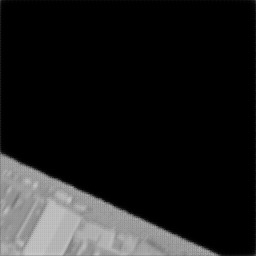

In [0]:
#Test on train set
data_x = model.predict(X[5].reshape(1,256,256,3))
cv2_imshow( data_x.reshape(256,256)*255 )

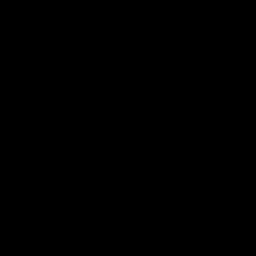